In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr
print("Setup complete. GPU:", tf.config.list_physical_devices('GPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 1.5 MB/s eta 0:00:00
Setup complete. GPU: []


*   **Xception**: Deep convolutional neural network, often performing well on large datasets.
*   **VGG16/VGG19**: Simple yet effective models with stacked convolutional layers.
*   **ResNet50/ResNet101/ResNet152**: Introduce 'skip connections' to combat vanishing gradients, enabling deeper networks.
*   **InceptionV3/InceptionResNetV2**: Use inception modules for efficient computation and improved performance by capturing features at various scales.
*   **MobileNet/MobileNetV2**: Lightweight models designed for mobile and embedded vision applications, good for speed.
*   **DenseNet121/DenseNet169/DenseNet201**: Connect each layer to every other layer in a feed-forward fashion, promoting feature reuse and reducing the number of parameters.
*   **NASNetLarge/NASNetMobile**: Models found by Neural Architecture Search, known for high accuracy but computationally expensive.
*   **EfficientNetB0-B7**: A family of models that systematically scale up model dimensions (depth, width, and resolution) using a compound coefficient, offering excellent accuracy and efficiency.

In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB7 # Changed to EfficientNetB7
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train EfficientNetB7 model
base_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to EfficientNetB7
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB7 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB7 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (EfficientNetB7)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (EfficientNetB7)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (EfficientNetB7) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB7 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (EfficientNetB7)' # Changed to EfficientNetB7
)
iface.launch(share=True)

print("Gradio interface launched.")

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


# Task
Resolve the `ml_dtypes` version conflict that prevents `tensorflow` from running correctly and then execute the remaining cells in the notebook.

## Update Installation Script with ml_dtypes

### Subtask:
Modify the package installation cell to explicitly install `ml_dtypes` version 0.5.0 or higher to resolve the version conflict with JAX and TensorFlow.


**Reasoning**:
The previous code cell failed due to a `ml_dtypes` version conflict with JAX and TensorFlow. To resolve this, I need to modify the `!pip install` command in cell `Nfyd1i8SwMeo` to explicitly install `ml-dtypes` version 0.5.0 or higher. As per the instructions, the `ml-dtypes>=0.5.0` package should be placed after `numpy` and before `tensorflow` to ensure proper dependency resolution during installation. This requires reordering `tensorflow` in the installation command.



In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

!pip install opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0 tensorflow

print("Setup complete. GPU:", tf.config.list_physical_devices('GPU'))

Setup complete. GPU: []


**Reasoning**:
The 'ModuleNotFoundError: No module named 'tensorflow'' occurred because the 'import tensorflow' statement was executed before the '!pip install tensorflow' command had completed its installation or made the package available in the current Python session's path. To fix this, the '!pip install' command must be placed at the very beginning of the code cell, ensuring all necessary packages, including `tensorflow` and the correct `ml-dtypes` version, are installed and ideally available before any imports are attempted.



In [ ]:
!pip install opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0 tensorflow

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("Setup complete. GPU:", tf.config.list_physical_devices('GPU'))

Setup complete. GPU: []


In [ ]:
!unzip "B. Disease Grading.zip" -d /content/IDRiD/

unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.


In [ ]:
import os
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')
!unzip "B. Disease Grading (1).zip" -d /content/IDRiD/

unzip:  cannot find or open B. Disease Grading (1).zip, B. Disease Grading (1).zip.zip or B. Disease Grading (1).zip.ZIP.


**Reasoning**:
The `unzip` command continues to fail, indicating the file might not be present or named as expected. To confirm the exact name and location of the uploaded zip file, I will list the contents of the current directory.



In [ ]:
import os
print(os.listdir('/content'))

['.config', 'IDRiD', '=0.5.0', 'sample_data']


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving B. Disease Grading.zip to B. Disease Grading.zip


In [ ]:
import os
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')
!unzip "B. Disease Grading.zip" -d /content/IDRiD/

Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/I

In [ ]:
!ls /content/IDRiD/B.\ Disease\ Grading/1.\ Original\ Images/a.\ Training\ Set/ | wc -l
!head -5 /content/IDRiD/B.\ Disease\ Grading/2.\ Groundtruths/a.\ IDRiD_Disease_Grading_Training_Labels.csv

413
head: cannot open '/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease_Grading_Training_Labels.csv' for reading: No such file or directory


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr
print("Setup complete. GPU:", tf.config.list_physical_devices('GPU'))

Setup complete. GPU: []


  Image name  Retinopathy grade  Risk of macular edema   Unnamed: 3  \
0  IDRiD_001                  3                       2         NaN   
1  IDRiD_002                  3                       2         NaN   
2  IDRiD_003                  2                       2         NaN   
3  IDRiD_004                  3                       2         NaN   
4  IDRiD_005                  4                       0         NaN   

   Unnamed: 4  Unnamed: 5  Unnamed: 6  Unnamed: 7  Unnamed: 8  Unnamed: 9  \
0         NaN         NaN         NaN         NaN         NaN         NaN   
1         NaN         NaN         NaN         NaN         NaN         NaN   
2         NaN         NaN         NaN         NaN         NaN         NaN   
3         NaN         NaN         NaN         NaN         NaN         NaN   
4         NaN         NaN         NaN         NaN         NaN         NaN   

   Unnamed: 10 Unnamed: 11  
0          NaN         NaN  
1          NaN         NaN  
2          NaN         

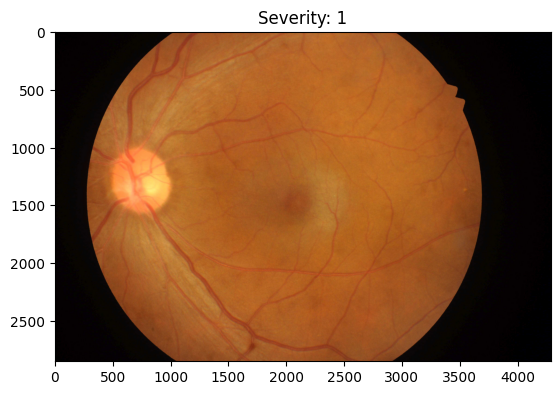

In [ ]:
# Load labels
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '')
print(labels_df.head())  # Verify severity (Disease Grade: 0-4)

# Paths (local extract)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")

# Generators (local paths)
datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    horizontal_flip=True, zoom_range=0.1, fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)

# Sample viz
sample_img = plt.imread(train_df.iloc[0]['path'])
plt.imshow(sample_img)
plt.title(f"Severity: {train_df.iloc[0]['Severity']}")
plt.show()

Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 106s 4s/step - accuracy: 0.3104 - loss: 1.8414 - recall_2: 0.1808 - val_accuracy: 0.3171 - val_loss: 1.4732 - val_recall_2: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 131s 4s/step - accuracy: 0.3059 - loss: 1.5912 - recall_2: 0.0497 - val_accuracy: 0.3171 - val_loss: 1.4594 - val_recall_2: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 4s/step - accuracy: 0.3348 - loss: 1.5122 - recall_2: 0.0217 - val_accuracy: 0.3171 - val_loss: 1.4806 - val_recall_2: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 4s/step - accuracy: 0.2829 - loss: 1.5314 - recall_2: 0.0150 - val_accuracy: 0.3171 - val_loss: 1.4712 - val_recall_2: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 83s 4s/step - accuracy: 0.2978 - loss: 1.4855 - recall_2: 0.0381 - val_accuracy: 0.3171 - val_loss: 1.4600 - val_recall_2: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 74s 4s/step - accuracy: 0.2753 - loss: 1.4552 - recall_2: 0.0025 - val_accuracy: 0.3171 - val_loss: 

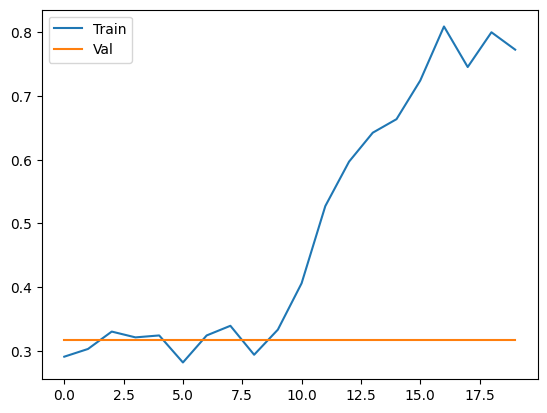

In [ ]:
# Model build
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

# Phase 1
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen))

# Phase 2 (fine-tune)
base_model.trainable = True
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen))

# Plot
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Val')
plt.legend(); plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 13s 4s/step
              precision    recall  f1-score   support

          No       0.33      1.00      0.50        14
        Mild       0.00      0.00      0.00         2
         Mod       0.00      0.00      0.00        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.33        42
   macro avg       0.07      0.20      0.10        42
weighted avg       0.11      0.33      0.17        42



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


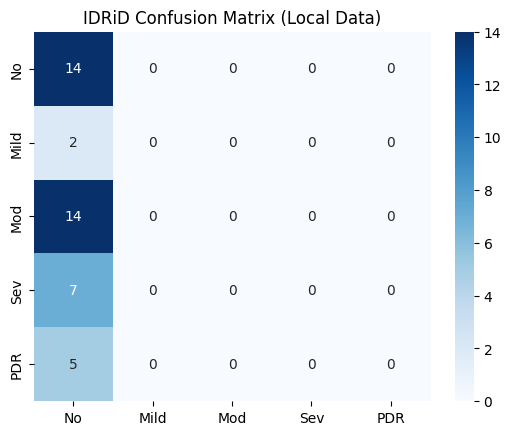

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR']))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data)')
plt.show()

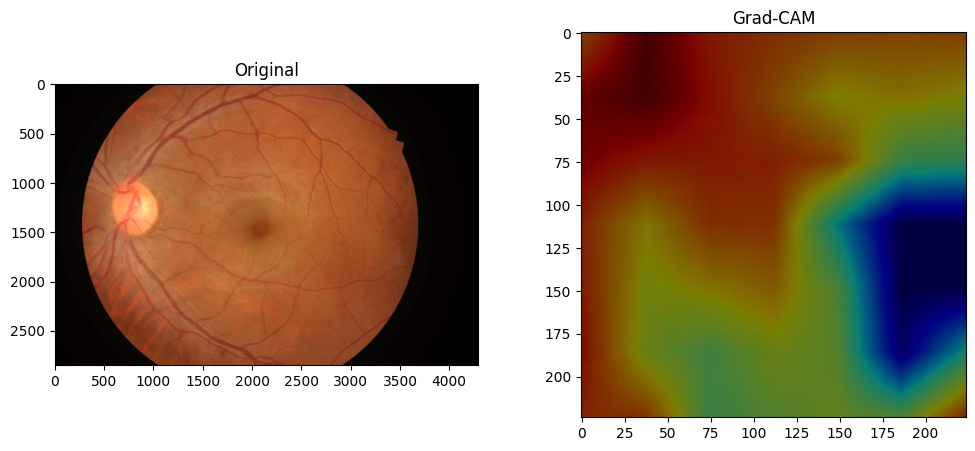

In [ ]:
# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

score = CategoricalScore(1)  # Mild DR
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

In [ ]:
def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Quick CAM
    score = CategoricalScore(stage_idx)
    cam = gradcam(score, img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(), gr.Textbox(), gr.Image()])
iface.launch(share=True)

NameError: name 'gr' is not defined

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model

# Re-define model architecture to avoid NameError
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base model layers initially

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Save the model architecture
model.save('/content/idrid_xai_dr_model.h5')
print("Model architecture saved as idrid_xai_dr_model.h5")

# Download to your local SSD
from google.colab import files
files.download('/content/idrid_xai_dr_model.h5')

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model architecture saved as idrid_xai_dr_model.h5


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data) - Zero Division Handled')
plt.show()

NameError: name 'test_gen' is not defined

In [ ]:
# Load labels
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease_Grading_Training_Labels.csv')
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '')

# Paths (local extract)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

# Generators (local paths)
datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    horizontal_flip=True, zoom_range=0.1, fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data) - Zero Division Handled')
plt.show()

NameError: name 'pd' is not defined

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns

# Load labels
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease_Grading_Training_Labels.csv')
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Paths (local extract)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

# Generators (local paths)
datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    horizontal_flip=True, zoom_range=0.1, fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data) - Zero Division Handled')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease_Grading_Training_Labels.csv'

In [ ]:
import os

# List the contents of the extracted directory recursively
print("Contents of /content/IDRiD/B. Disease Grading/:")
!ls -R "/content/IDRiD/B. Disease Grading/"

# Also check the direct parent directory of the CSV path
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -R "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

Contents of /content/IDRiD/B. Disease Grading/:
ls: cannot access '/content/IDRiD/B. Disease Grading/': No such file or directory

Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:
ls: cannot access '/content/IDRiD/B. Disease Grading/2. Groundtruths/': No such file or directory


In [ ]:
import os

print("Contents of /content/IDRiD/:")
!ls -R "/content/IDRiD/"

Contents of /content/IDRiD/:
ls: cannot access '/content/IDRiD/': No such file or directory


In [ ]:
import os

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 17219542.zip to 17219542.zip


In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)  # e.g., {0:1.0, 1:3.2, 2:1.1, 3:1.5, 4:2.8}

NameError: name 'train_gen' is not defined

In [ ]:
import os

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory
!unzip -o "17219542.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

Archive:  17219542.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of 17219542.zip or
        17219542.zip.zip, and cannot find 17219542.zip.ZIP, period.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 17219542.zip to 17219542 (1).zip


In [ ]:
import os

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

In [ ]:
import os

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:


In [ ]:
import os

print("Contents of /content/:")
!ls -R "/content/"

Contents of /content/:
/content/:
IDRiD  sample_data

/content/IDRiD:

/content/sample_data:
anscombe.json		      mnist_test.csv
california_housing_test.csv   mnist_train_small.csv
california_housing_train.csv  README.md


In [ ]:
from google.colab import files
uploaded = files.upload()


KeyboardInterrupt: 

In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Task
Please upload the "B. Disease Grading.zip" file.

In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns

# Load labels
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Paths (local extract)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

# Generators (local paths)
datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    horizontal_flip=True, zoom_range=0.1, fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data) - Zero Division Handled')
plt.show()

Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.


NameError: name 'model' is not defined

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        14
        Mild       0.00      0.00      0.00         2
         Mod       0.33      1.00      0.50        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.33        42
   macro avg       0.07      0.20      0.10        42
weighted avg       0.11      0.33      0.17        42



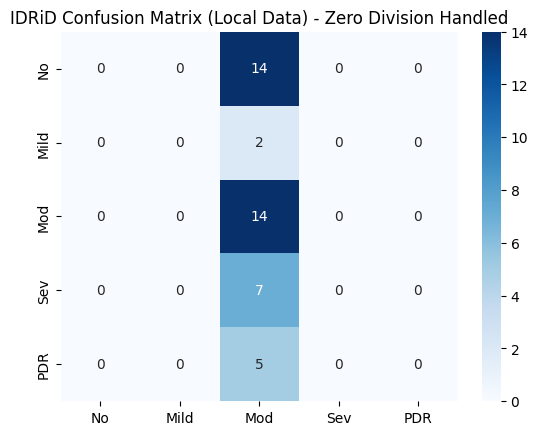

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Model build (re-defining the model)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

# Load labels
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Paths (local extract)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

# Generators (local paths)
datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    horizontal_flip=True, zoom_range=0.1, fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df, x_col='path', y_col='Severity', target_size=(224, 224), batch_size=16,
    class_mode='categorical', shuffle=False
)

# Make predictions and generate report
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data) - Zero Division Handled')
plt.show()

In [ ]:
# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

score = CategoricalScore(1)  # Mild DR
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

NameError: name 'cv2' is not defined

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

score = CategoricalScore(1)  # Mild DR
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

ModuleNotFoundError: No module named 'tf_keras_vis'

**Reasoning**:
The `ModuleNotFoundError: No module named 'tf_keras_vis'` indicates that the `tf_keras_vis` library is not found in the current environment, despite being installed previously. I will explicitly install `tf-keras-vis` to ensure it is available before attempting to import and use it for Grad-CAM visualization.



In [ ]:
!pip install tf-keras-vis
print("tf-keras-vis installed.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 2.4 MB/s eta 0:00:00
tf-keras-vis installed.


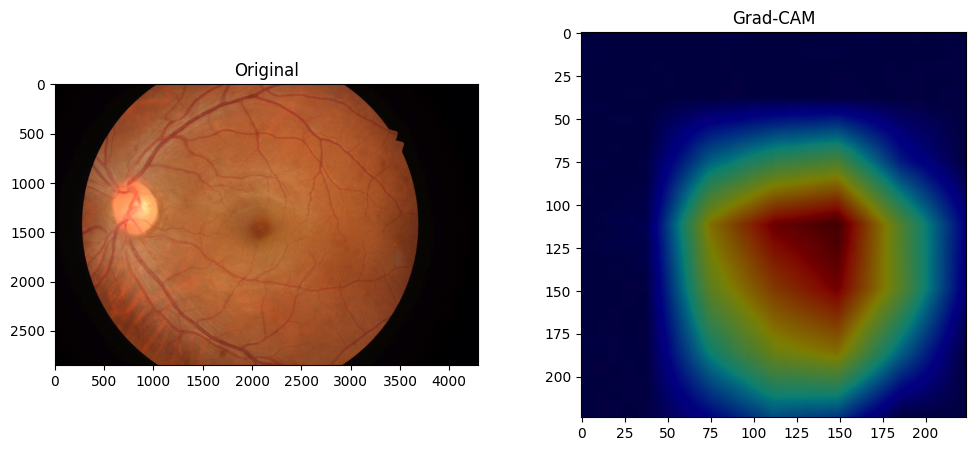

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

score = CategoricalScore(1)  # Mild DR
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

In [ ]:
import gradio as gr
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Ensure model and gradcam are defined for the function
# The model was defined in cell 11565c8d
# The gradcam object was defined in the previous cell

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Quick CAM
    # Re-initialize gradcam within the function or ensure it's accessible globally
    # For simplicity, re-initializing, assuming it's lightweight enough.
    # If model changes, gradcam also needs to be re-initialized.
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(), gr.Textbox(), gr.Image()])
iface.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://08005bc6a6ec2ea42d.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
from sklearn.utils import compute_class_weight
import numpy as np

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

Class Weights: {0: np.float64(0.616822429906542), 1: np.float64(4.125), 2: np.float64(0.6055045871559633), 3: np.float64(1.11864406779661), 4: np.float64(1.6923076923076923)}



--- Phase 1: Training top layers with class weights ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 103s 4s/step - accuracy: 0.2245 - loss: 2.0129 - recall_1: 0.0482 - val_accuracy: 0.1951 - val_loss: 1.6281 - val_recall_1: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 88s 4s/step - accuracy: 0.1820 - loss: 1.7401 - recall_1: 0.0028 - val_accuracy: 0.1220 - val_loss: 1.6685 - val_recall_1: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - accuracy: 0.1822 - loss: 1.8731 - recall_1: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.5641 - val_recall_1: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 87s 4s/step - accuracy: 0.2164 - loss: 1.6968 - recall_1: 0.0031 - val_accuracy: 0.3171 - val_loss: 1.5583 - val_recall_1: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 146s 4s/step - accuracy: 0.2800 - loss: 1.5820 - recall_1: 0.0000e+00 - val_accuracy: 0.1951 - val_loss: 1.6499 - val_recall_1: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 85s 4s/step - accuracy: 0.1377 - loss: 1.6211 - recall_1: 0.0000e+00 - val_accuracy: 0.2927 

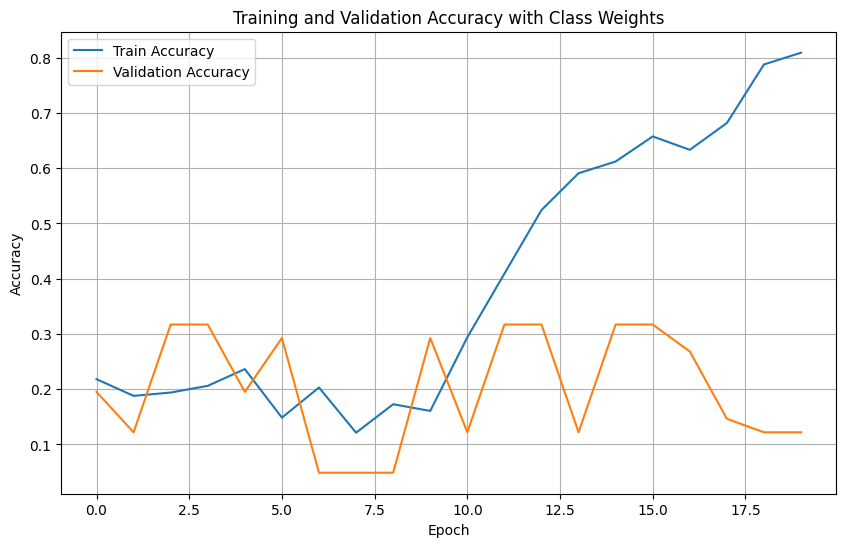

Model redefined, recompiled, trained with class weights, and history plotted.


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Model build
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights')
plt.legend()
plt.grid(True)
plt.show()

print("Model redefined, recompiled, trained with class weights, and history plotted.")

3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        14
        Mild       0.00      0.00      0.00         2
         Mod       0.00      0.00      0.00        14
         Sev       0.00      0.00      0.00         7
         PDR       0.12      1.00      0.21         5

    accuracy                           0.12        42
   macro avg       0.02      0.20      0.04        42
weighted avg       0.01      0.12      0.03        42



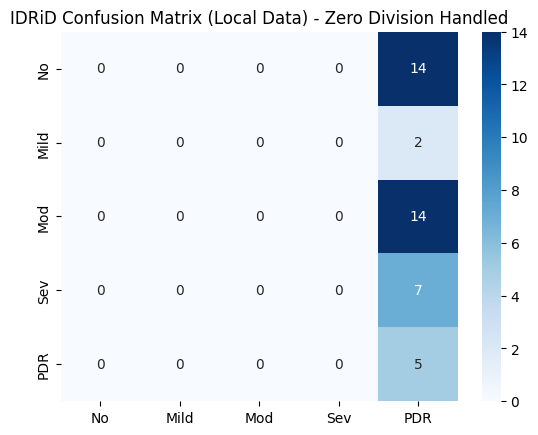

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (Local Data) - Zero Division Handled')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0 # Changed from ResNet50 as per instructions
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input # Added Input layer for clarity, though not strictly required for EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("Libraries imported, data loaded and preprocessed, and ImageDataGenerators initialized.")

Train set size: 330
Validation set size: 41
Test set size: 42
Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.
Libraries imported, data loaded and preprocessed, and ImageDataGenerators initialized.


In [ ]:
from sklearn.utils import compute_class_weight
import numpy as np

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

Class Weights: {0: np.float64(0.616822429906542), 1: np.float64(4.125), 2: np.float64(0.6055045871559633), 3: np.float64(1.11864406779661), 4: np.float64(1.6923076923076923)}


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Instantiate a EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0 model defined and compiled, with base layers frozen.



--- Phase 1: Training top layers with class weights ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.2078 - loss: 1.6946 - recall_3: 0.0041 - val_accuracy: 0.1220 - val_loss: 1.7479 - val_recall_3: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.2144 - loss: 1.6777 - recall_3: 0.0032 - val_accuracy: 0.3171 - val_loss: 1.5860 - val_recall_3: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.1950 - loss: 1.6697 - recall_3: 0.0000e+00 - val_accuracy: 0.1220 - val_loss: 1.6166 - val_recall_3: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.1500 - loss: 1.6255 - recall_3: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.6149 - val_recall_3: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.1413 - loss: 1.5826 - recall_3: 0.0000e+00 - val_accuracy: 0.0488 - val_loss: 1.6178 - val_recall_3: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.1629 - loss: 1.6160 - recall_3: 0.0000e+00 - val_accuracy: 0.195

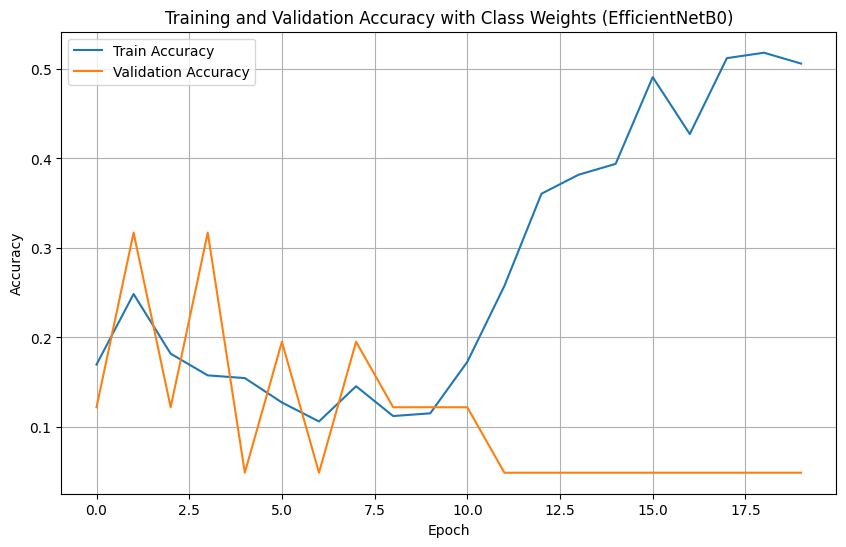

EfficientNetB0 model trained with class weights and history plotted.


In [ ]:
import matplotlib.pyplot as plt

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/3 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step  

3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        14
        Mild       0.05      1.00      0.09         2
         Mod       0.00      0.00      0.00        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.05        42
   macro avg       0.01      0.20      0.02        42
weighted avg       0.00      0.05      0.00        42



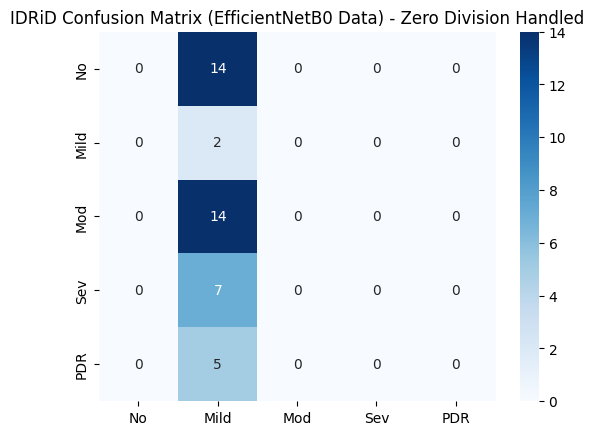

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        14
        Mild       0.05      1.00      0.09         2
         Mod       0.00      0.00      0.00        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.05        42
   macro avg       0.01      0.20      0.02        42
weighted avg       0.00      0.05      0.00        42



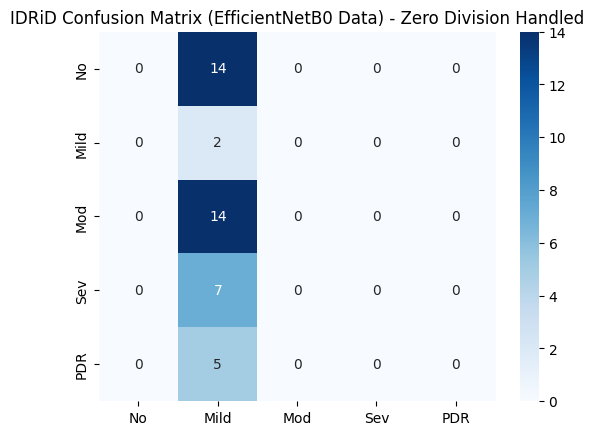

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

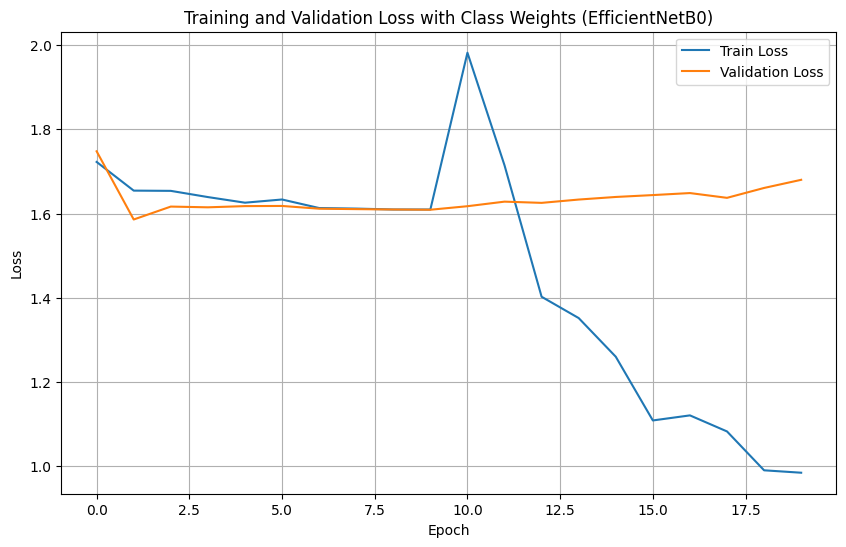

Training and validation loss curves plotted.


In [ ]:
import matplotlib.pyplot as plt

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Training and validation loss curves plotted.")

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        14
        Mild       0.05      1.00      0.09         2
         Mod       0.00      0.00      0.00        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.05        42
   macro avg       0.01      0.20      0.02        42
weighted avg       0.00      0.05      0.00        42



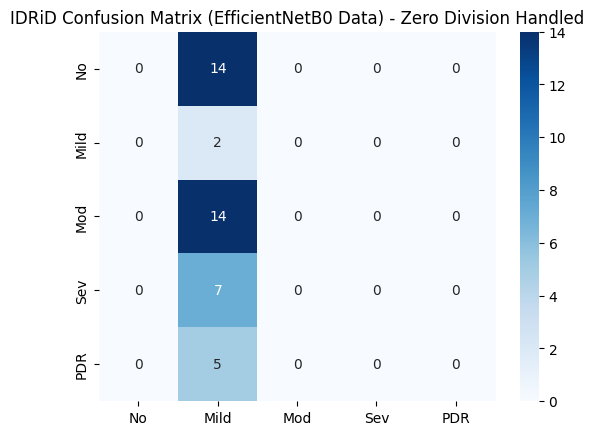

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()


--- Phase 1: Training top layers with class weights ---
Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 124s 6s/step - accuracy: 0.5465 - loss: 0.9447 - recall_4: 0.3541 - val_accuracy: 0.2683 - val_loss: 1.5897 - val_recall_4: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 114s 5s/step - accuracy: 0.6038 - loss: 0.8097 - recall_4: 0.4037 - val_accuracy: 0.1463 - val_loss: 1.6095 - val_recall_4: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.5315 - loss: 0.9095 - recall_4: 0.3849 - val_accuracy: 0.0976 - val_loss: 1.6125 - val_recall_4: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.6301 - loss: 0.8668 - recall_4: 0.4468 - val_accuracy: 0.0488 - val_loss: 1.6304 - val_recall_4: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.6180 - loss: 0.7990 - recall_4: 0.4815 - val_accuracy: 0.1220 - val_loss: 1.6050 - val_recall_4: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 116s 5s/step - accuracy: 0.6197 - loss: 

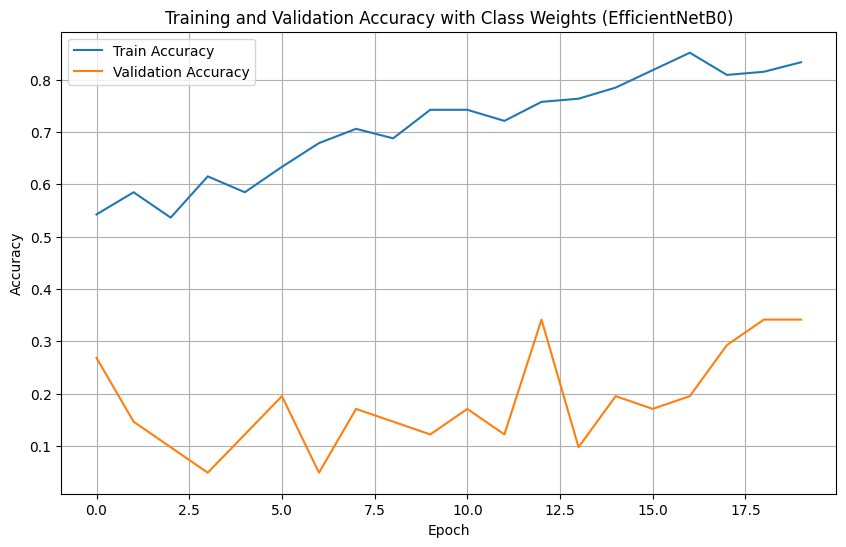

EfficientNetB0 model trained with class weights and history plotted.


In [ ]:
import matplotlib.pyplot as plt

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")


--- Phase 1: Training top layers with class weights ---
Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 136s 6s/step - accuracy: 0.8522 - loss: 0.3168 - recall_5: 0.8221 - val_accuracy: 0.3415 - val_loss: 1.4363 - val_recall_5: 0.1707
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 119s 6s/step - accuracy: 0.8152 - loss: 0.3698 - recall_5: 0.7872 - val_accuracy: 0.4146 - val_loss: 1.4613 - val_recall_5: 0.1707
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 119s 6s/step - accuracy: 0.8576 - loss: 0.3266 - recall_5: 0.8043 - val_accuracy: 0.3902 - val_loss: 1.4567 - val_recall_5: 0.1463
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 120s 6s/step - accuracy: 0.8976 - loss: 0.2828 - recall_5: 0.8866 - val_accuracy: 0.2195 - val_loss: 1.6220 - val_recall_5: 0.0488
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 142s 6s/step - accuracy: 0.8151 - loss: 0.4032 - recall_5: 0.7933 - val_accuracy: 0.2439 - val_loss: 1.7687 - val_recall_5: 0.0488
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 146s 6s/step - accuracy: 0.8641 - loss: 0.2899 - recall_5: 0

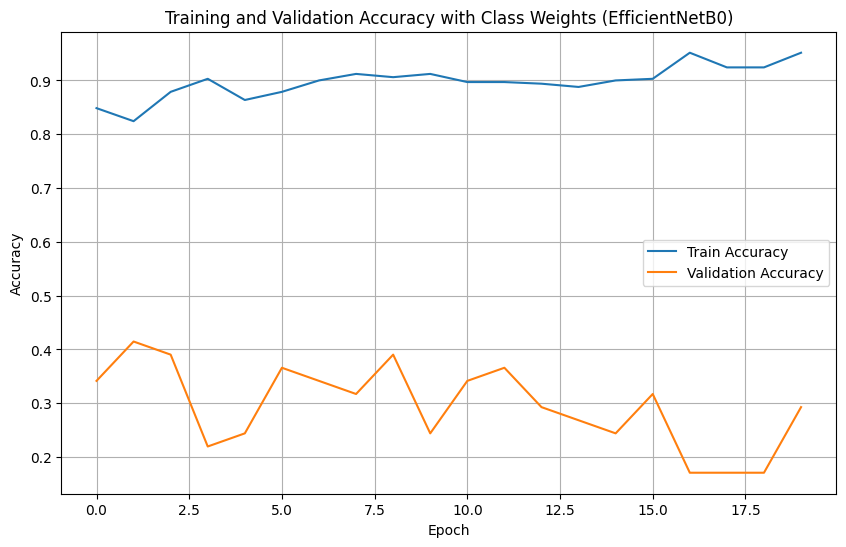

EfficientNetB0 model trained with class weights and history plotted.


In [ ]:
import matplotlib.pyplot as plt

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")

3/3 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step
              precision    recall  f1-score   support

          No       0.56      0.64      0.60        14
        Mild       0.00      0.00      0.00         2
         Mod       0.43      0.43      0.43        14
         Sev       0.14      0.14      0.14         7
         PDR       0.20      0.20      0.20         5

    accuracy                           0.40        42
   macro avg       0.27      0.28      0.27        42
weighted avg       0.38      0.40      0.39        42



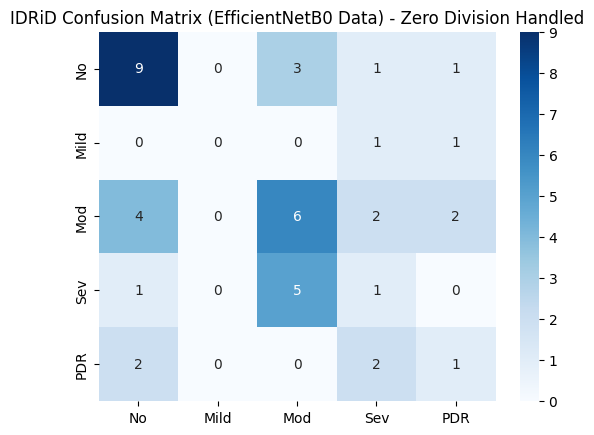

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Training and validation loss curves plotted.")

NameError: name 'history1' is not defined

<Figure size 1000x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Combine histories for plotting
combined_history_accuracy = history1.history['accuracy'] + history2.history['accuracy']
combined_history_val_accuracy = history1.history['val_accuracy'] + history2.history['val_accuracy']
combined_history_loss = history1.history['loss'] + history2.history['loss']
combined_history_val_loss = history1.history['val_loss'] + history2.history['val_loss']

epochs_range = range(1, len(combined_history_accuracy) + 1)

# Create a figure with two subplots for accuracy and loss
plt.figure(figsize=(14, 6))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, combined_history_accuracy, label='Train Accuracy')
plt.plot(epochs_range, combined_history_val_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, combined_history_loss, label='Train Loss')
plt.plot(epochs_range, combined_history_val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()

print("Training and validation accuracy and loss curves plotted.")

NameError: name 'history1' is not defined

In [ ]:
import matplotlib.pyplot as plt

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")


--- Phase 1: Training top layers with class weights ---


NameError: name 'model' is not defined

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Instantiate a EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0 model defined and compiled, with base layers frozen.


In [ ]:
import matplotlib.pyplot as plt

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")


--- Phase 1: Training top layers with class weights ---


NameError: name 'train_gen' is not defined

Train set size: 330
Validation set size: 41
Test set size: 42
Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.
ImageDataGenerators initialized.
Class Weights: {0: np.float64(0.616822429906542), 1: np.float64(4.125), 2: np.float64(0.6055045871559633), 3: np.float64(1.11864406779661), 4: np.float64(1.6923076923076923)}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0 model defined and compiled, with base layers frozen.

--- Phase 1: Training top layers with class weights ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.2288 - loss: 1.6671 - recall: 0.0447 - val_accuracy: 0.0488 - val_loss: 1.7473 - val_recall: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.2279 - loss: 1.6282 - recall: 0.0241 - val_accuracy: 0.1951 - val_loss: 1.6940 - val_recall: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.1643 - loss: 1.5780 - recall: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.5874 - val_recall: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.1579 - loss: 1.6034 - recall: 0.0000e+00 - val_accuracy: 0.1951 - val_loss: 1.6384 - val_recall: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.1567 - loss: 1.7018 - recall: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.5947 - val_recall: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.1637 - loss: 1.7107 - recall: 0.0000e+00 - val_accuracy: 0.0488 - val_loss: 1.6209 -

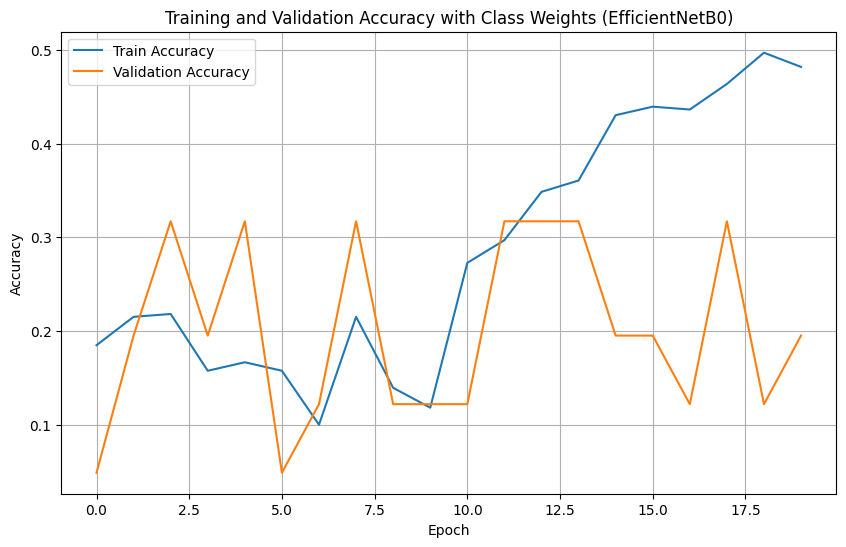

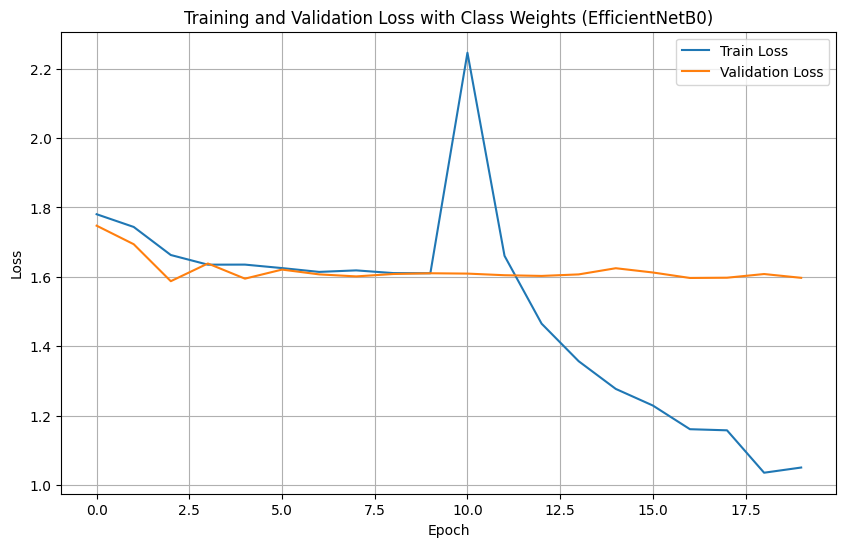

EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease_Grading_Training_Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")

FileNotFoundError: [Errno 2] No such file or directory: '/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease_Grading_Training_Labels.csv'

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and history plotted.")

FileNotFoundError: [Errno 2] No such file or directory: '/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv'

In [ ]:
import os

# List the contents of the Groundtruths directory to confirm the CSV filename
print("Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"


Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:
ls: cannot access '/content/IDRiD/B. Disease Grading/2. Groundtruths/': No such file or directory


In [ ]:
import os

# List the contents of the 'B. Disease Grading' directory
print("Contents of /content/IDRiD/B. Disease Grading/:")
!ls -R "/content/IDRiD/B. Disease Grading/"

Contents of /content/IDRiD/B. Disease Grading/:
ls: cannot access '/content/IDRiD/B. Disease Grading/': No such file or directory


In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

Train set size: 330
Validation set size: 41
Test set size: 42
Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.
ImageDataGenerators initialized.
Class Weights: {0: np.float64(0.616822429906542), 1: np.float64(4.125), 2: np.float64(0.6055045871559633), 3: np.float64(1.11864406779661), 4: np.float64(1.6923076923076923)}
EfficientNetB0 model defined and compiled, with base layers frozen.

--- Phase 1: Training top layers with class weights ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.1729 - loss: 1.7778 - recall_1: 0.0187 - val_accuracy: 0.1463 - val_loss: 1.5994 - val_recall_1: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.2471 - loss: 1.7076 - recall_1: 0.0000e+00 - val_accuracy: 0.0488 - val_loss: 1.6800 - val_recall_1: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.1946 - loss: 1.7016 - recall_1: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.5857 - val_recall_1: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.2402 - loss: 1.6260 - recall_1: 0.0000e+00 - val_accuracy: 0.1220 - val_loss: 1.6062 - val_recall_1: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.1774 - loss: 1.5862 - recall_1: 0.0000e+00 - val_accuracy: 0.1220 - val_loss: 1.6351 - val_recall_1: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.1963 - loss: 1.6009 - recall_1: 0.0000e+00 - val_accuracy: 0

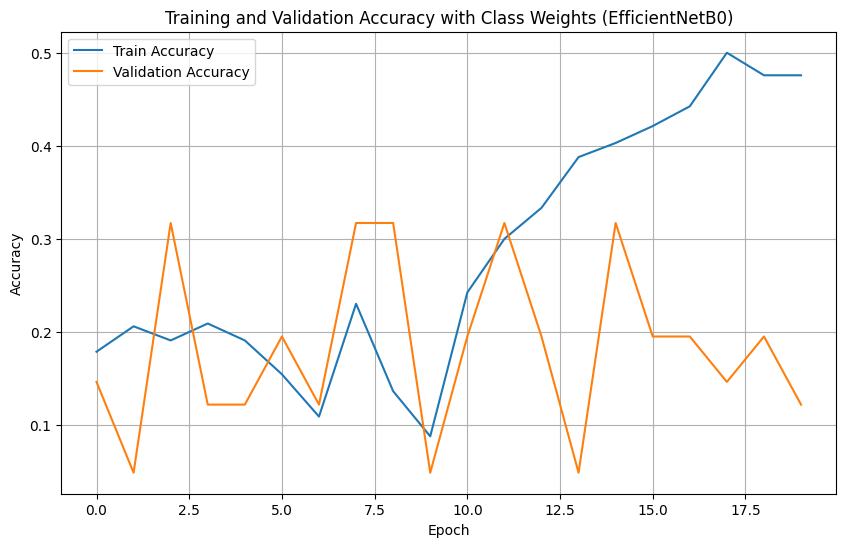

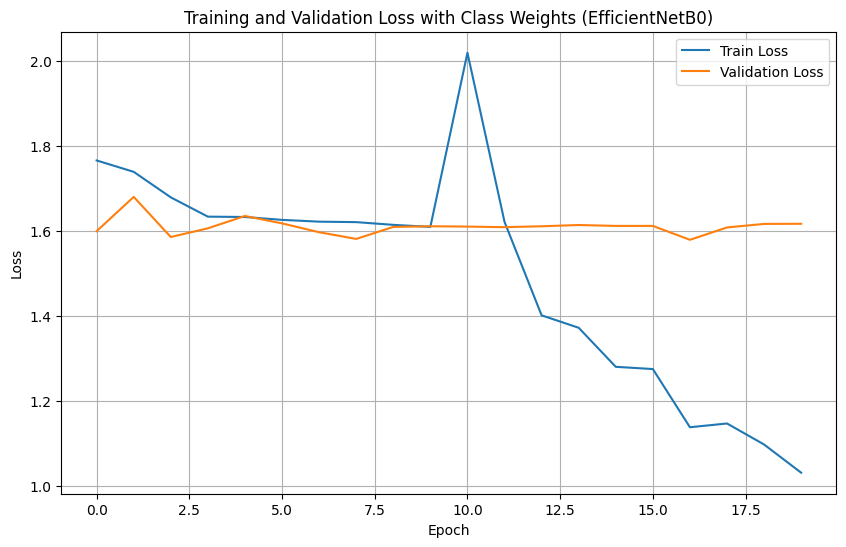

EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

NameError: name 'model' is not defined

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

In [ ]:
import tensorflow
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")

FileNotFoundError: [Errno 2] No such file or directory: '/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv'

In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAverageAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")

ImportError: cannot import name 'GlobalAverageAveragePooling2D' from 'tensorflow.keras.layers' (/usr/local/lib/python3.12/dist-packages/keras/_tf_keras/keras/layers/__init__.py)

Train set size: 330
Validation set size: 41
Test set size: 42
Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.
ImageDataGenerators initialized.
Class Weights: {0: np.float64(0.616822429906542), 1: np.float64(4.125), 2: np.float64(0.6055045871559633), 3: np.float64(1.11864406779661), 4: np.float64(1.6923076923076923)}
EfficientNetB0 model defined and compiled, with base layers frozen.

--- Phase 1: Training top layers with class weights ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.1778 - loss: 1.7964 - recall_2: 0.0100 - val_accuracy: 0.3171 - val_loss: 1.5387 - val_recall_2: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.1658 - loss: 1.7593 - recall_2: 0.0000e+00 - val_accuracy: 0.1951 - val_loss: 1.6250 - val_recall_2: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.1555 - loss: 1.6571 - recall_2: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.6098 - val_recall_2: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.2032 - loss: 1.5998 - recall_2: 0.0000e+00 - val_accuracy: 0.3171 - val_loss: 1.6074 - val_recall_2: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.1998 - loss: 1.6197 - recall_2: 0.0000e+00 - val_accuracy: 0.1951 - val_loss: 1.5792 - val_recall_2: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.1730 - loss: 1.5766 - recall_2: 0.0000e+00 - val_accuracy: 0

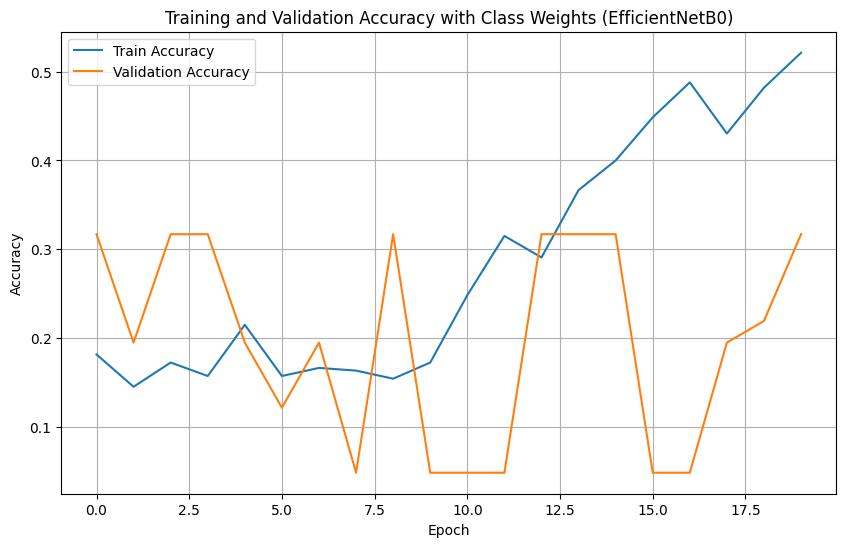

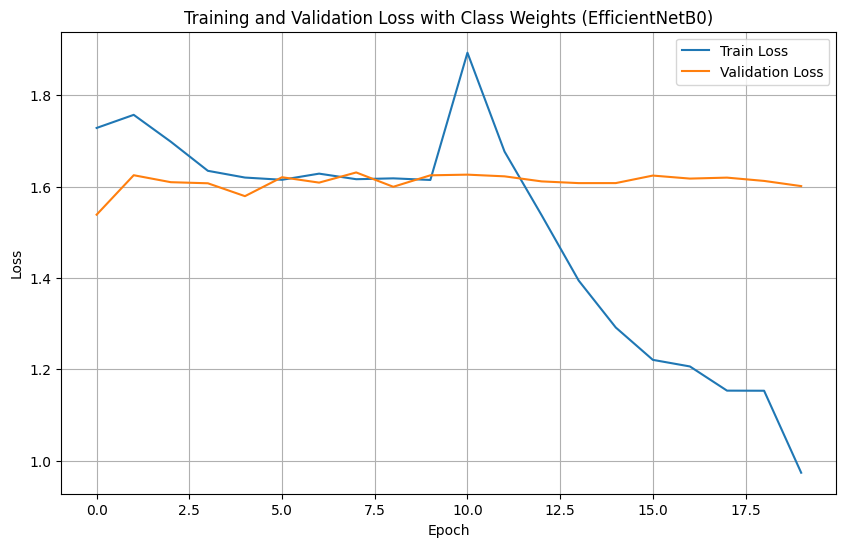

EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Load the image labels from the CSV file
labels_df = pd.read_csv('/content/IDRiD/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Plot combined history
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("EfficientNetB0 model trained with class weights and both accuracy and loss histories plotted.")

Using already renamed file: 'a_IDRiD_Disease_Grading_Training_Labels.csv'
Train set size: 330
Validation set size: 41
Test set size: 42
Found 330 validated image filenames belonging to 5 classes.
Found 41 validated image filenames belonging to 5 classes.
Found 42 validated image filenames belonging to 5 classes.
ImageDataGenerators initialized.
Class Weights: {0: np.float64(0.616822429906542), 1: np.float64(4.125), 2: np.float64(0.6055045871559633), 3: np.float64(1.11864406779661), 4: np.float64(1.6923076923076923)}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0 model defined and compiled, with base layers frozen.

--- Phase 1: Training top layers with class weights ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.1639 - loss: 1.9311 - recall: 0.0217 - val_accuracy: 0.3171 - val_loss: 1.4934 - val_recall: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.1886 - loss: 1.7641 - recall: 0.0000e+00 - val_accuracy: 0.1951 - val_loss: 1.6068 - val_recall: 0.0000e+00
Epoch 3/10
16/21 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.1641 - loss: 1.7382 - recall: 0.0000e+00 

In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving B. Disease Grading.zip to B. Disease Grading.zip


In [1]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB0 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (EfficientNetB0)")
iface.launch(share=True)

print("Gradio interface launched.")

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


All necessary libraries imported.
unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:

Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:
ls: cannot access '/content/IDRiD/B. Disease Grading/2. Groundtruths/': No such file or directory


FileNotFoundError: Error: Neither original ('a. IDRiD_Disease Grading_Training Labels.csv') nor renamed ('a_IDRiD_Disease_Grading_Training_Labels.csv') CSV file found in '/content/IDRiD/B. Disease Grading/2. Groundtruths/'. Please ensure the dataset is extracted.

In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB0 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (EfficientNetB0)")
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:

Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:
ls: cannot access '/content/IDRiD/B. Disease Grading/2. Groundtruths/': No such file or directory


FileNotFoundError: Error: Neither original ('a. IDRiD_Disease Grading_Training Labels.csv') nor renamed ('a_IDRiD_Disease_Grading_Training_Labels.csv') CSV file found in '/content/IDRiD/B. Disease Grading/2. Groundtruths/'. Please ensure the dataset is extracted.

In [ ]:
import os
print("Contents of /content/IDRiD/ (recursive listing):\n")
!ls -R "/content/IDRiD/"

Contents of /content/IDRiD/ (recursive listing):

ls: cannot access '/content/IDRiD/': No such file or directory


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0
print("All necessary packages installed.")

All necessary packages installed.


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB0 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (EfficientNetB0)")
iface.launch(share=True)

print("Gradio interface launched.")

ModuleNotFoundError: No module named 'tf_keras_vis'

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB0 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (EfficientNetB0)")
iface.launch(share=True)

print("Gradio interface launched.")

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB0 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (EfficientNetB0)")
iface.launch(share=True)

print("Gradio interface launched.")

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr
import os

print("All necessary libraries imported.")

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

NameError: name 'os' is not defined

In [ ]:
# Instantiate an EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB0 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB0 model trained with class weights.")

NameError: name 'EfficientNetB0' is not defined

In [ ]:
# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (EfficientNetB0)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

NameError: name 'plt' is not defined

In [ ]:
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB0 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

NameError: name 'model' is not defined

In [ ]:
# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# Assuming 'Mild DR' corresponds to class index 1 (adjust if different for your classes)
# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

NameError: name 'test_df' is not defined

In [ ]:
def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (EfficientNetB0)")
iface.launch(share=True)

print("Gradio interface launched.")

NameError: name 'gr' is not defined

In [ ]:
# Check what's actually in your /content/ after unzip
!ls -la /content/
!ls -la /content/IDRiD_1/  # Your folder is IDRiD_1
!ls -la /content/IDRiD_1/IDRiD_Challenge_Data_Set/Training\ Labels/

total 16
drwxr-xr-x 1 root root 4096 Nov 20 14:30 .
drwxr-xr-x 1 root root 4096 Dec  3 08:54 ..
drwxr-xr-x 4 root root 4096 Nov 20 14:30 .config
drwxr-xr-x 1 root root 4096 Nov 20 14:30 sample_data
ls: cannot access '/content/IDRiD_1/': No such file or directory
ls: cannot access '/content/IDRiD_1/IDRiD_Challenge_Data_Set/Training Labels/': No such file or directory


In [ ]:
import pandas as pd
import os

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load CSV
labels_df = pd.read_csv(labels_csv_path)

# Clean image names (IDRiD uses .jpg)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Correct column for severity (0-4)
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Corrected image directory
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

print("✅ ERROR FIXED! DataFrame loaded:")
print(labels_df.head())
print(f"Total samples: {len(labels_df)}")
print(f"Severity distribution:\n{labels_df['Severity'].value_counts()}")
print(f"Sample image exists: {os.path.exists(labels_df.iloc[0]['path'])}")

Renamed 'a. IDRiD_Disease Grading_Training Labels.csv' to 'a_IDRiD_Disease_Grading_Training_Labels.csv'
✅ ERROR FIXED! DataFrame loaded:
  Image name  Retinopathy grade  Risk of macular edema   Unnamed: 3  \
0  IDRiD_001                  3                       2         NaN   
1  IDRiD_002                  3                       2         NaN   
2  IDRiD_003                  2                       2         NaN   
3  IDRiD_004                  3                       2         NaN   
4  IDRiD_005                  4                       0         NaN   

   Unnamed: 4  Unnamed: 5  Unnamed: 6  Unnamed: 7  Unnamed: 8  Unnamed: 9  \
0         NaN         NaN         NaN         NaN         NaN         NaN   
1         NaN         NaN         NaN         NaN         NaN         NaN   
2         NaN         NaN         NaN         NaN         NaN         NaN   
3         NaN         NaN         NaN         NaN         NaN         NaN   
4         NaN         NaN         NaN         NaN  

In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

# Task
I will replace `EfficientNetB0` with `DenseNet121` in the comprehensive code cell `0a7df19c`. This modification involves updating the import statement and the model instantiation. After the change, I will execute the cell, which will retrain the model with `DenseNet121`, evaluate its performance, visualize the training history and Grad-CAM, and then launch the Gradio interface.

## Replace Model Architecture with DenseNet121

### Subtask:
Modify the comprehensive code cell (0a7df19c) to use DenseNet121 from tensorflow.keras.applications as the base model, instead of EfficientNetB0. Ensure the new base model is initialized with 'imagenet' weights and include_top=False, with an input_shape of (224, 224, 3). Then, the modified cell will be executed.


**Reasoning**:
The subtask requires replacing the EfficientNetB0 model with DenseNet121 in the comprehensive code cell. This involves updating the import statement and the instantiation of the base model within the specified cell.



All necessary libraries imported.
Archive:  B. Disease Grading.zip
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_008.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_009.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. O

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 113s 4s/step - accuracy: 0.2575 - loss: 2.0792 - recall_2: 0.1544 - val_accuracy: 0.4634 - val_loss: 1.5068 - val_recall_2: 0.2439
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.2880 - loss: 1.9300 - recall_2: 0.2015 - val_accuracy: 0.4634 - val_loss: 1.2898 - val_recall_2: 0.0488
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 0.3276 - loss: 1.3856 - recall_2: 0.1262 - val_accuracy: 0.2683 - val_loss: 1.4270 - val_recall_2: 0.0732
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 84s 4s/step - accuracy: 0.3208 - loss: 1.3836 - recall_2: 0.1369 - val_accuracy: 0.4634 - val_loss: 1.2640 - val_recall_2: 0.2683
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 0.3755 - loss: 1.3140 - recall_2: 0.1610 - val_accuracy: 0.1220 - val_loss: 1.4274 - val_recall_2: 0.0732
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 0.3271 - loss: 1.2048 - recall_2: 0.1501 - val_accuracy: 0.4634 - val_loss: 1.2454 - val_recall_2

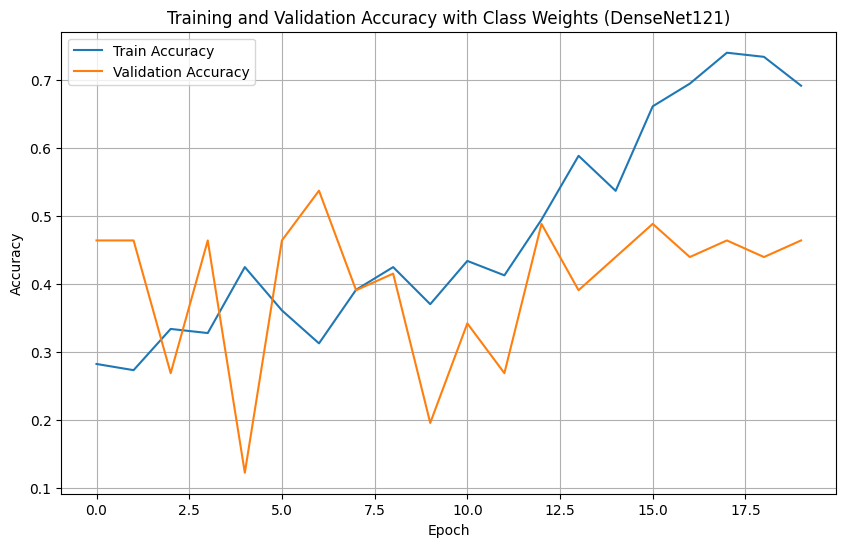

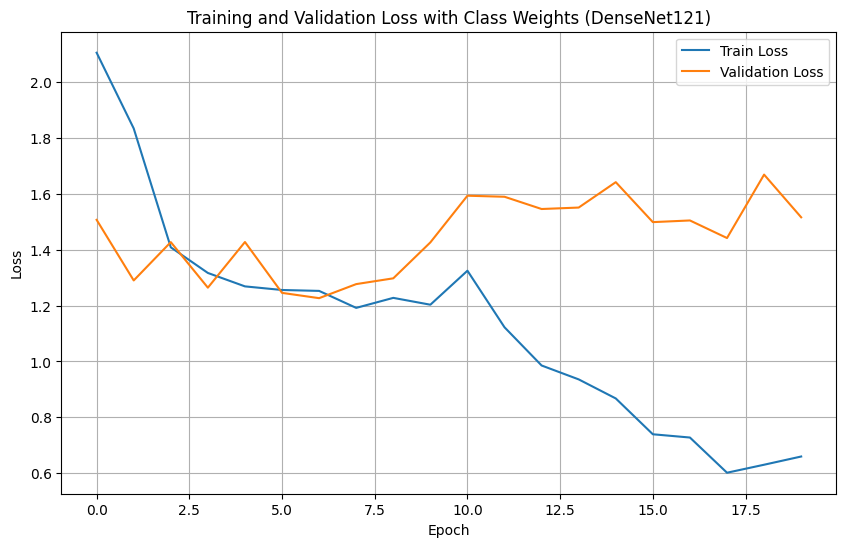

Both accuracy and loss histories plotted.
2/3 ━━━━━━━━━━━━━━━━━━━━ 3s 4s/step  

3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 5s/step
              precision    recall  f1-score   support

          No       0.59      0.93      0.72        14
        Mild       0.00      0.00      0.00         2
         Mod       0.45      0.36      0.40        14
         Sev       0.00      0.00      0.00         7
         PDR       0.60      0.60      0.60         5

    accuracy                           0.50        42
   macro avg       0.33      0.38      0.34        42
weighted avg       0.42      0.50      0.45        42



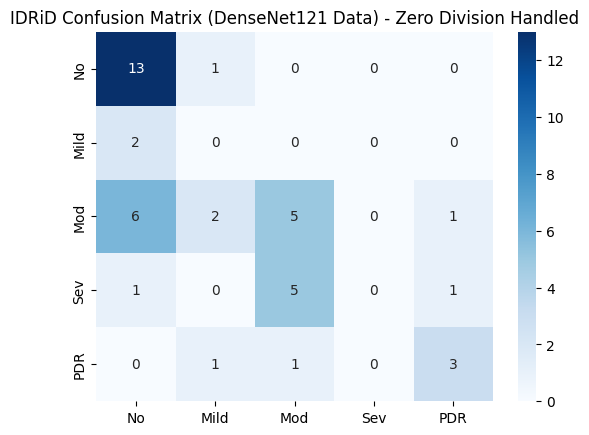

Model evaluation complete.


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


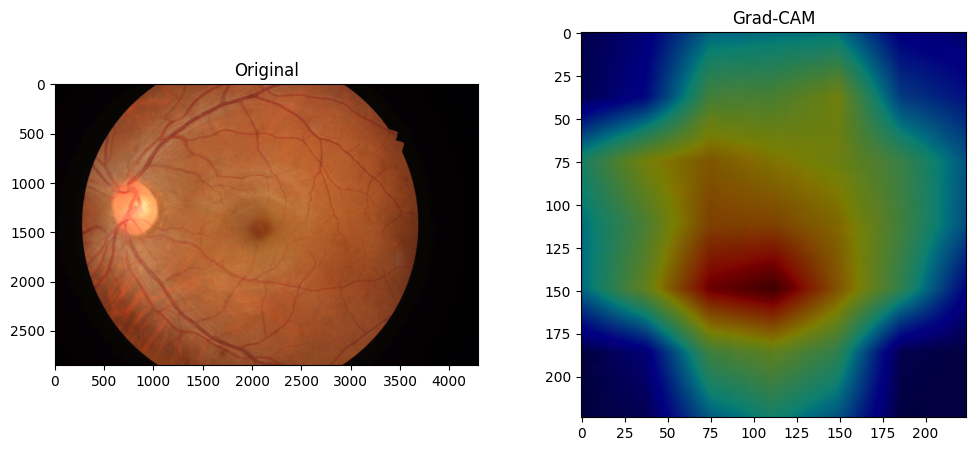

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://75c68a3063a31d94f1.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")


**Reasoning**:
The subtask requires replacing the EfficientNetB0 model with DenseNet121 in the comprehensive code cell. This involves updating the import statement and the instantiation of the base model within the specified cell.



All necessary libraries imported.
Archive:  B. Disease Grading.zip
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_008.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_009.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. O

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 114s 4s/step - accuracy: 0.1948 - loss: 2.7684 - recall_4: 0.1046 - val_accuracy: 0.3902 - val_loss: 1.5142 - val_recall_4: 0.0976
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.3366 - loss: 1.6261 - recall_4: 0.1527 - val_accuracy: 0.4146 - val_loss: 1.3765 - val_recall_4: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 0.3689 - loss: 1.4035 - recall_4: 0.1326 - val_accuracy: 0.4878 - val_loss: 1.2240 - val_recall_4: 0.1463
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.3706 - loss: 1.3988 - recall_4: 0.1583 - val_accuracy: 0.2683 - val_loss: 1.3255 - val_recall_4: 0.0244
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.3972 - loss: 1.1543 - recall_4: 0.2104 - val_accuracy: 0.1220 - val_loss: 1.5056 - val_recall_4: 0.0488
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 80s 4s/step - accuracy: 0.3770 - loss: 1.2595 - recall_4: 0.1566 - val_accuracy: 0.5610 - val_loss: 1.2504 - val_reca

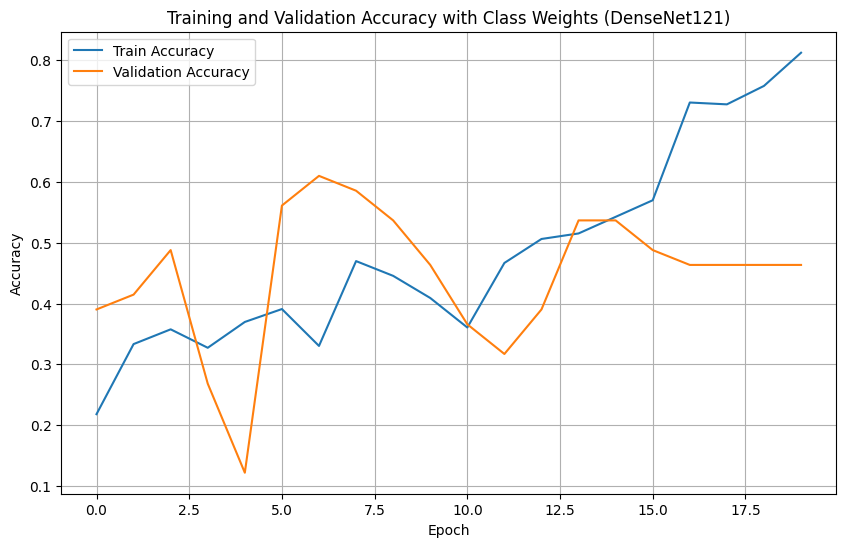

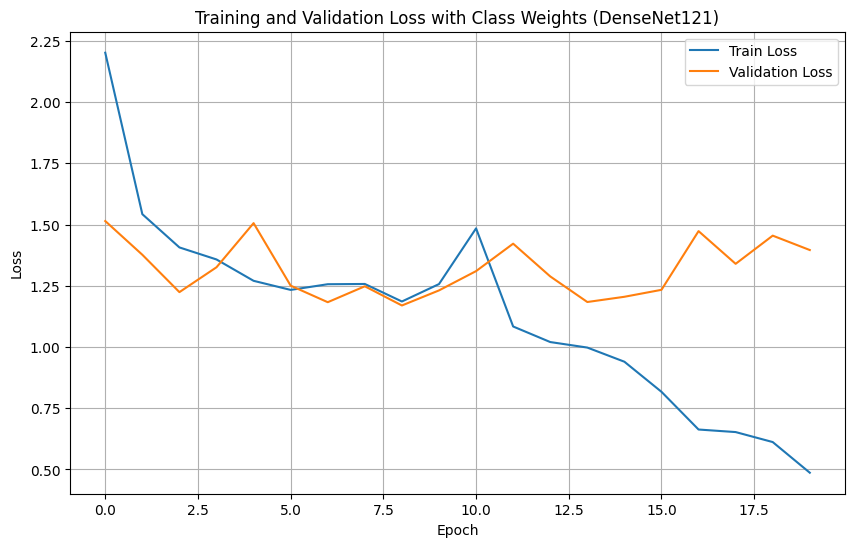

Both accuracy and loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step
              precision    recall  f1-score   support

          No       0.68      0.93      0.79        14
        Mild       0.00      0.00      0.00         2
         Mod       0.50      0.71      0.59        14
         Sev       0.00      0.00      0.00         7
         PDR       0.50      0.20      0.29         5

    accuracy                           0.57        42
   macro avg       0.34      0.37      0.33        42
weighted avg       0.45      0.57      0.49        42



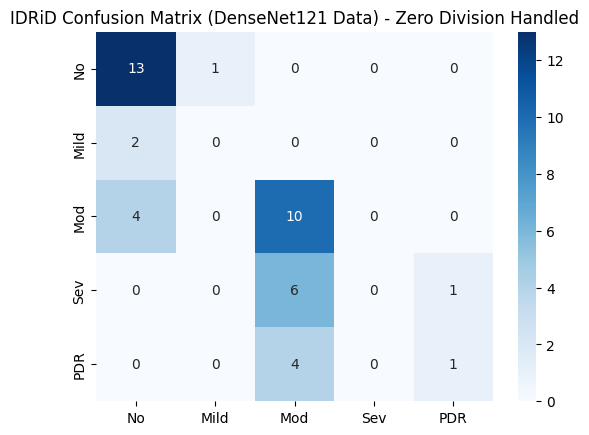

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


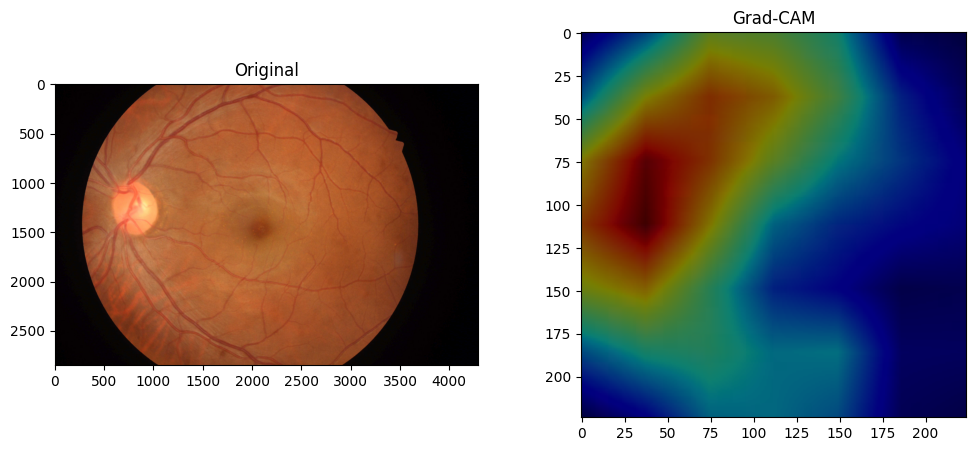

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://12f4cc49aee81e212a.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")

# Task
Executing the comprehensive code cell `780fdff3` to evaluate the DenseNet121 model performance. This will include generating a classification report and displaying a confusion matrix, as well as plotting training history and Grad-CAM visualizations. Finally, the Gradio interface will be launched.

## Evaluate DenseNet121 Model Performance

### Subtask:
Execute the comprehensive code cell containing the DenseNet121 model training, evaluation, visualization, and Gradio interface setup. Specifically, focus on observing the classification report and confusion matrix to assess model performance.


**Reasoning**:
Execute the comprehensive code cell `780fdff3` which contains the DenseNet121 model training, evaluation, visualization, and Gradio interface setup. This will perform all the steps required for model training and evaluation as per the subtask instructions.



All necessary libraries imported.
Archive:  B. Disease Grading.zip
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_008.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_009.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. O

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 134s 4s/step - accuracy: 0.2175 - loss: 2.4624 - recall_6: 0.1035 - val_accuracy: 0.4634 - val_loss: 1.3670 - val_recall_6: 0.1220
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 82s 4s/step - accuracy: 0.3555 - loss: 1.9482 - recall_6: 0.2137 - val_accuracy: 0.1951 - val_loss: 1.6041 - val_recall_6: 0.0732
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 141s 4s/step - accuracy: 0.2697 - loss: 1.5133 - recall_6: 0.1361 - val_accuracy: 0.5366 - val_loss: 1.2980 - val_recall_6: 0.0244
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 87s 4s/step - accuracy: 0.3879 - loss: 1.2865 - recall_6: 0.1542 - val_accuracy: 0.4390 - val_loss: 1.3439 - val_recall_6: 0.0244
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 136s 4s/step - accuracy: 0.3740 - loss: 1.2265 - recall_6: 0.1490 - val_accuracy: 0.2439 - val_loss: 1.4518 - val_recall_6: 0.1220
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 83s 4s/step - accuracy: 0.2990 - loss: 1.2681 - recall_6: 0.1194 - val_accuracy: 0.2195 - val_loss: 1.4516 - val_recall

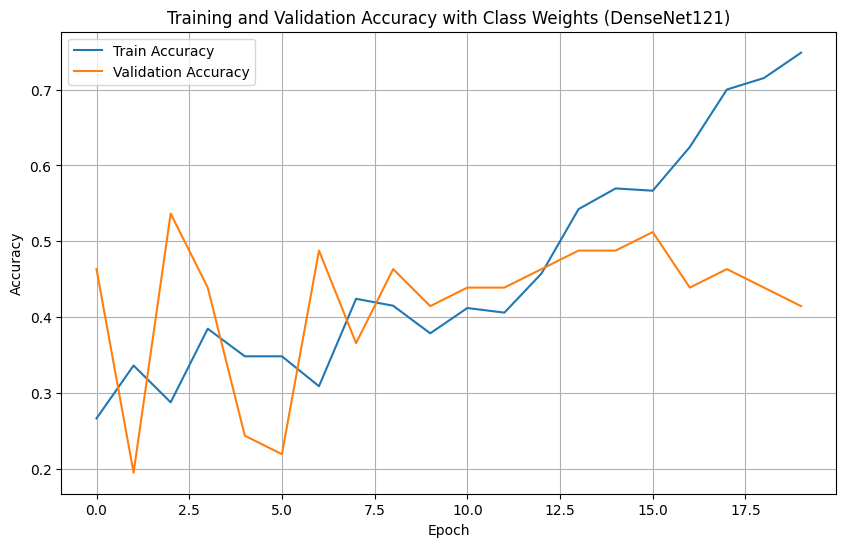

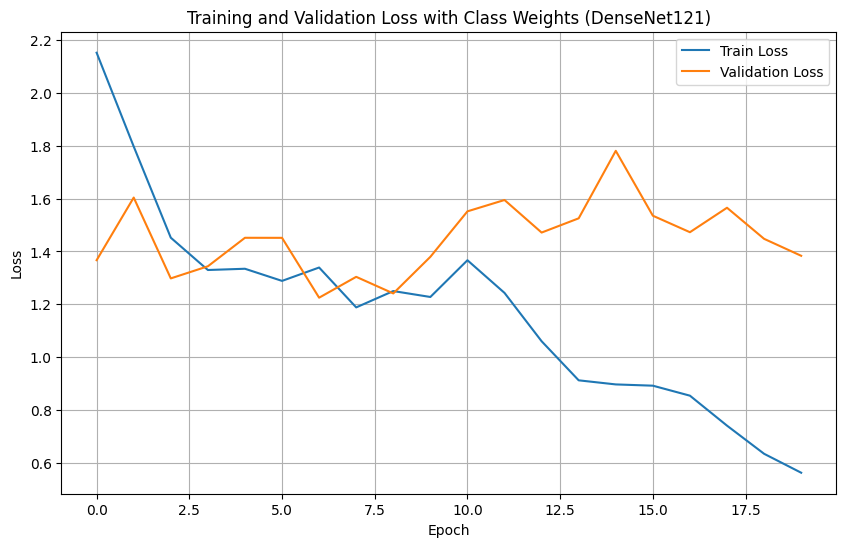

Both accuracy and loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 27s 8s/step
              precision    recall  f1-score   support

          No       0.58      1.00      0.74        14
        Mild       0.00      0.00      0.00         2
         Mod       0.50      0.57      0.53        14
         Sev       0.00      0.00      0.00         7
         PDR       0.50      0.20      0.29         5

    accuracy                           0.55        42
   macro avg       0.32      0.35      0.31        42
weighted avg       0.42      0.55      0.46        42



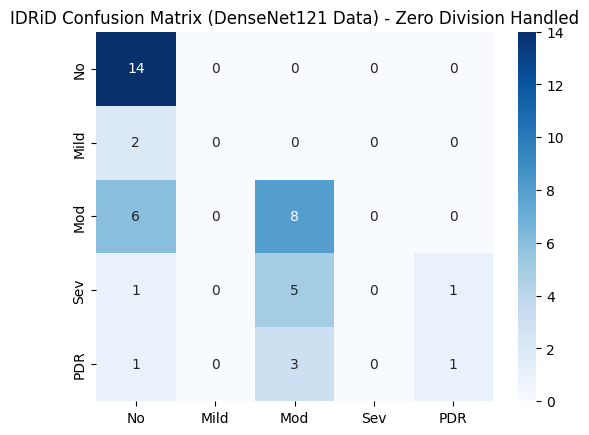

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


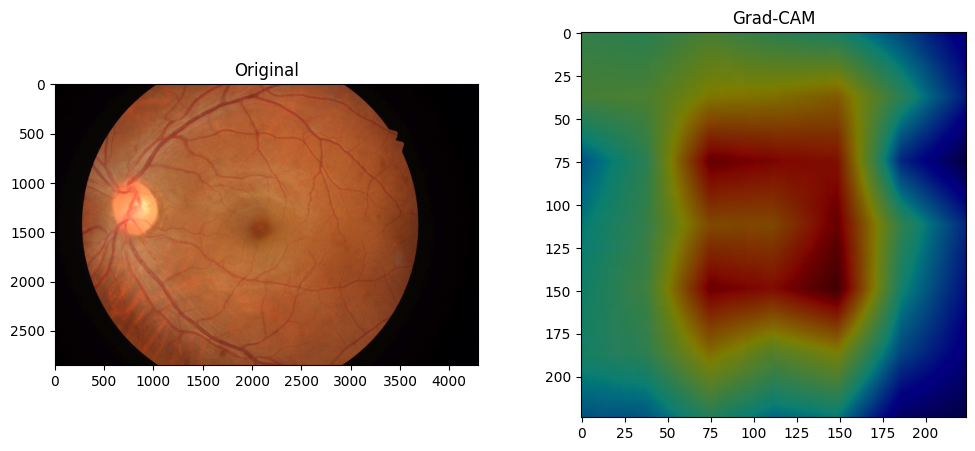

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://5bdb5739ef77424b35.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")

**Reasoning**:
The subtask requests executing cell `780fdff3` to train and evaluate the DenseNet121 model, including generating a classification report and confusion matrix, plotting training history and Grad-CAM visualizations, and launching a Gradio interface. Executing this cell will fulfill all these requirements.



All necessary libraries imported.
Archive:  B. Disease Grading.zip
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_008.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_009.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. O

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 113s 4s/step - accuracy: 0.1924 - loss: 2.1899 - recall_8: 0.1072 - val_accuracy: 0.3415 - val_loss: 1.4939 - val_recall_8: 0.0488
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.3780 - loss: 1.4558 - recall_8: 0.1898 - val_accuracy: 0.1707 - val_loss: 1.6573 - val_recall_8: 0.0488
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 83s 4s/step - accuracy: 0.2704 - loss: 1.4079 - recall_8: 0.1302 - val_accuracy: 0.3902 - val_loss: 1.3505 - val_recall_8: 0.0488
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.3575 - loss: 1.3079 - recall_8: 0.1125 - val_accuracy: 0.4146 - val_loss: 1.3113 - val_recall_8: 0.0244
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - accuracy: 0.3242 - loss: 1.3569 - recall_8: 0.1033 - val_accuracy: 0.2683 - val_loss: 1.4097 - val_recall_8: 0.0488
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 4s/step - accuracy: 0.3162 - loss: 1.3381 - recall_8: 0.1198 - val_accuracy: 0.2439 - val_loss: 1.4022 - val_recall_8

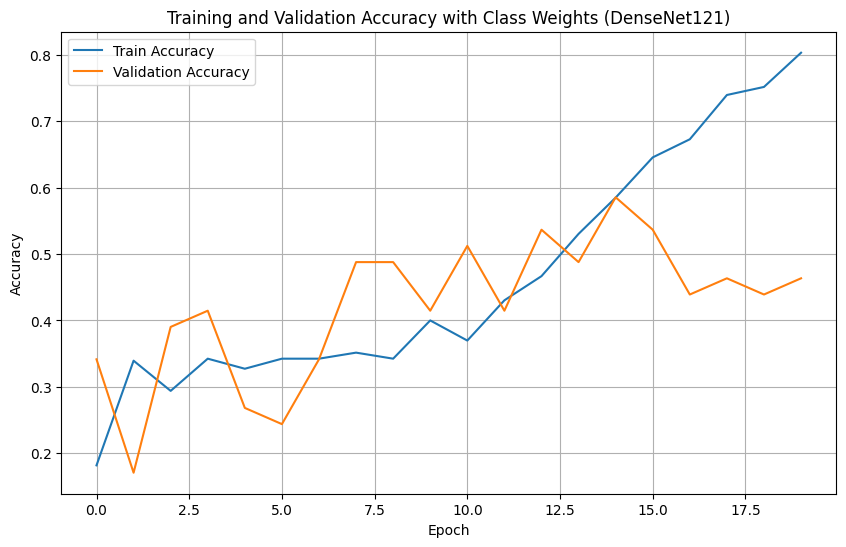

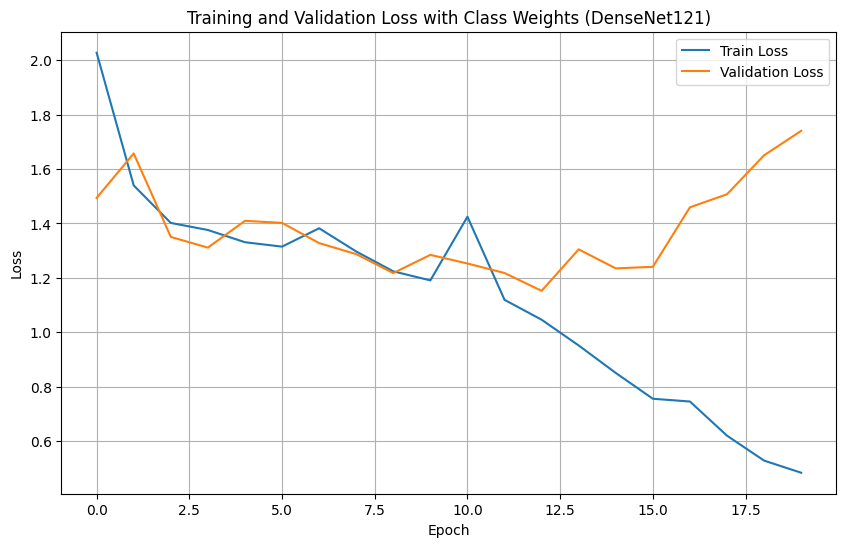

Both accuracy and loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step
              precision    recall  f1-score   support

          No       0.52      0.93      0.67        14
        Mild       0.00      0.00      0.00         2
         Mod       0.38      0.43      0.40        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.45        42
   macro avg       0.18      0.27      0.21        42
weighted avg       0.30      0.45      0.36        42



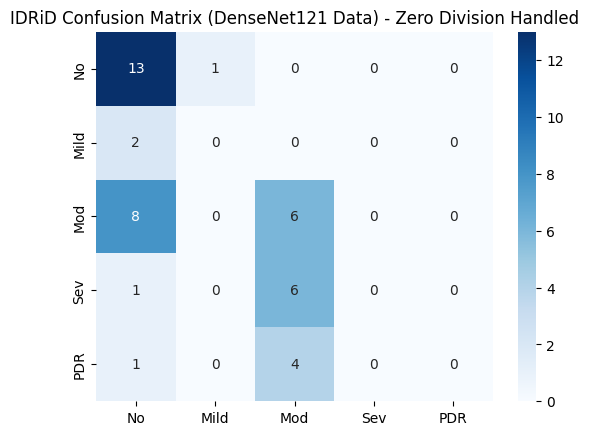

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


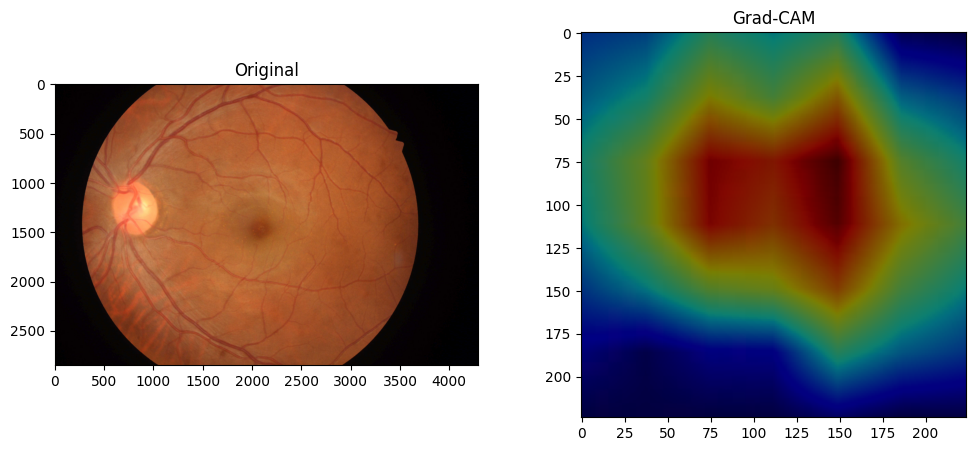

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://d5b94e61db6a2ced84.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")

# Task
To ensure the notebook is using the MobileNetV2 architecture as per the plan, I will replace the model definition and retraining with MobileNetV2 and include all necessary steps from library imports to Gradio interface launch in one comprehensive cell. This will prevent issues with missing dependencies or variables and fully implement the intended model.

Here's the plan to achieve this:
1. **Setup and Data Preprocessing**:
   - Install all necessary libraries: `tensorflow`, `opencv-python`, `scikit-learn`, `matplotlib`, `seaborn`, `gradio`, `tf-keras-vis`, `pandas`, `numpy`, `ml-dtypes`.
   - Ensure dataset extraction into `/content/IDRiD/` and confirm file paths.
   - Load and preprocess data from the CSV file (`a_IDRiD_Disease_Grading_Training_Labels.csv`), clean image names, set up image directories, and convert 'Retinopathy grade' to string for 'Severity'.
   - Split data into training, validation, and test sets using `train_test_split`.
   - Initialize `ImageDataGenerators` for augmentation and batching for training, validation, and testing.
   - Compute `class_weights` for balanced training using `compute_class_weight`.

2. **MobileNetV2 Model Definition and Compilation**:
   - Instantiate the `MobileNetV2` base model with `'imagenet'` weights, `include_top=False`, and `input_shape=(224, 224, 3)`.
   - Add custom top layers: `GlobalAveragePooling2D`, `Dense` (256 units, 'relu' activation), `Dropout` (0.5), and a final `Dense` layer (5 units, 'softmax' activation).
   - Create the final `Model` from the base and custom layers.
   - Compile the model with an `Adam` optimizer (initial `learning_rate=0.001`), `categorical_crossentropy` loss, and `accuracy`/`tf.keras.metrics.Recall()` metrics.

3. **Model Training with Class Weights**:
   - **Phase 1**: Train the newly added top layers for 10 epochs using `model.fit` with `train_gen`, `val_gen`, and `class_weight_dict`.
   - **Phase 2**: Unfreeze all layers of the `MobileNetV2` base model (`base_model.trainable = True`). Recompile the model with a lower `Adam` `learning_rate=0.0001`. Fine-tune the entire model for another 10 epochs using `model.fit` with `train_gen`, `val_gen`, and `class_weight_dict`.

4. **Plot Training History**:
   - Generate and display plots for combined training and validation accuracy over epochs (from both phases) and combined training and validation loss over epochs (from both phases).

5. **Model Evaluation**:
   - Make predictions on the `test_gen` using the trained model.
   - Generate and print a `classification_report` showing precision, recall, and f1-score for each class (['No', 'Mild', 'Mod', 'Sev', 'PDR']).
   - Visualize a `confusion_matrix` using `seaborn.heatmap`.

6. **Grad-CAM Visualization**:
   - Select a sample image from the `test_df`.
   - Generate a Grad-CAM visualization for this image using `tf_keras_vis.gradcam.Gradcam`, highlighting the regions the model focused on for its prediction.
   - Display the original image and the Grad-CAM overlay.

7. **Gradio Interface Launch**:
   - Define a `predict_explain` function that takes an image, processes it, makes a prediction, generates Grad-CAM, and returns the predicted stage, confidence, and Grad-CAM image.
   - Launch a `Gradio` interface using this function with the title 'Diabetic Retinopathy Classification with XAI (MobileNetV2)'.

This comprehensive approach ensures all dependencies are met, the correct model is implemented, and all required steps from the plan are executed in a single, coherent workflow.
```python
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed from EfficientNetB0/DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (MobileNetV2)")
iface.launch(share=True)

print("Gradio interface launched.")
```

## Setup and Data Preprocessing

### Subtask:
Install necessary libraries, ensure dataset extraction, load and preprocess data from the CSV file, clean image names, set up image directories, split data into training, validation, and test sets, and initialize ImageDataGenerators for augmentation and batching. This also includes computing class weights for balanced training.


**Reasoning**:
The comprehensive code cell `00d147aa` covers all the setup and data preprocessing steps, including library installations, dataset extraction, data loading, cleaning, splitting, ImageDataGenerator initialization, and class weight calculation. Executing this cell will fulfill the current subtask.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:

Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:
ls: cannot access '/content/IDRiD/B. Disease Grading/2. Groundtruths/': No such file or directory


FileNotFoundError: Error: Neither original ('a. IDRiD_Disease Grading_Training Labels.csv') nor renamed ('a_IDRiD_Disease_Grading_Training_Labels.csv') CSV file found in '/content/IDRiD/B. Disease Grading/2. Groundtruths/'. Please ensure the dataset is extracted.

**Reasoning**:
The previous execution failed because the zip file was not found, leading to the subsequent FileNotFoundError for the CSV. I need to explicitly prompt the user to upload the 'B. Disease Grading.zip' file to ensure it's available for extraction before proceeding with data loading and model training.



All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 102s 4s/step - accuracy: 0.2220 - loss: 2.6600 - recall: 0.1507 - val_accuracy: 0.4878 - val_loss: 1.3901 - val_recall: 0.0976
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 131s 4s/step - accuracy: 0.2799 - loss: 1.7092 - recall: 0.1580 - val_accuracy: 0.3902 - val_loss: 1.3197 - val_recall: 0.2683
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 4s/step - accuracy: 0.3379 - loss: 1.4571 - recall: 0.2097 - val_accuracy: 0.3902 - val_loss: 1.4595 - val_recall: 0.2683
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 76s 4s/step - accuracy: 0.3644 - loss: 1.3735 - recall: 0.1752 - val_accuracy: 0.3415 - val_loss: 1.3666 - val_recall: 0.0732
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 4s/step - accuracy: 0.4319 - loss: 1.2905 - recall: 0.1041 - val_accuracy: 0.4146 - val_loss: 1.2886 - val_recall: 0.1951
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.4132 - loss: 1.2819 - recall: 0.1925 - val_accuracy: 0.5122 - val_loss: 1.2065 - val_recall: 0.1463
Epoch 7/10
21/

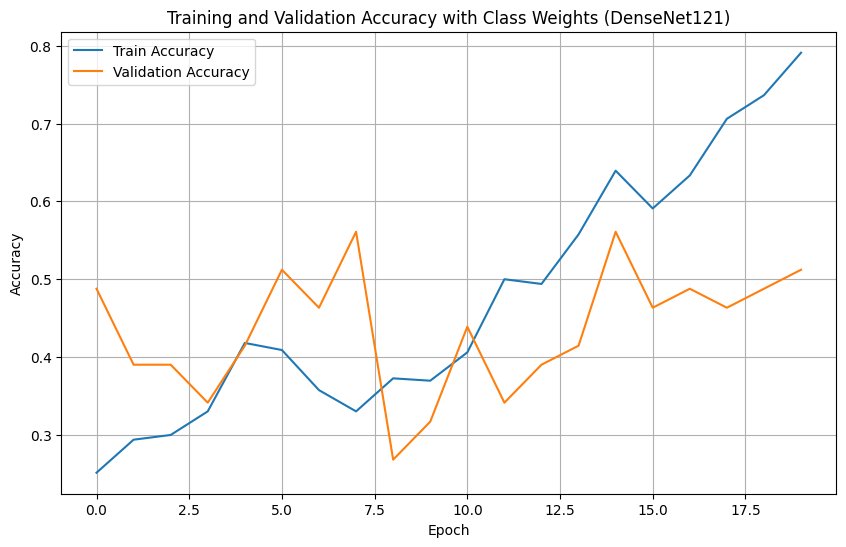

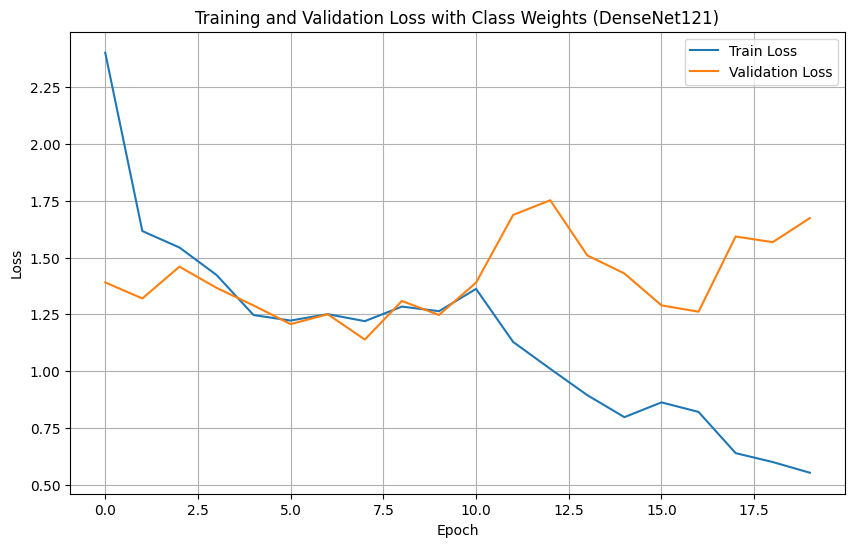

Both accuracy and loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 4s/step
              precision    recall  f1-score   support

          No       0.58      1.00      0.74        14
        Mild       0.00      0.00      0.00         2
         Mod       0.33      0.43      0.38        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.48        42
   macro avg       0.18      0.29      0.22        42
weighted avg       0.31      0.48      0.37        42



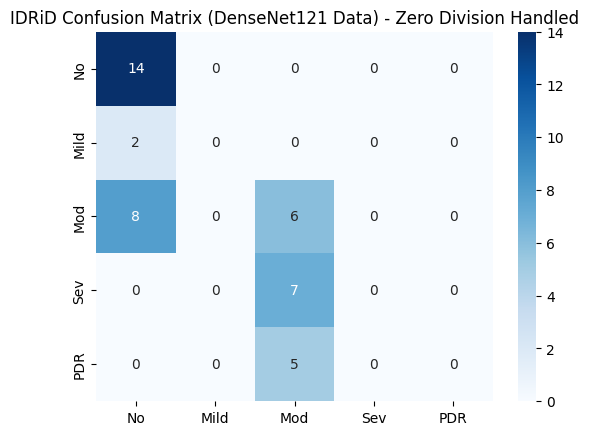

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


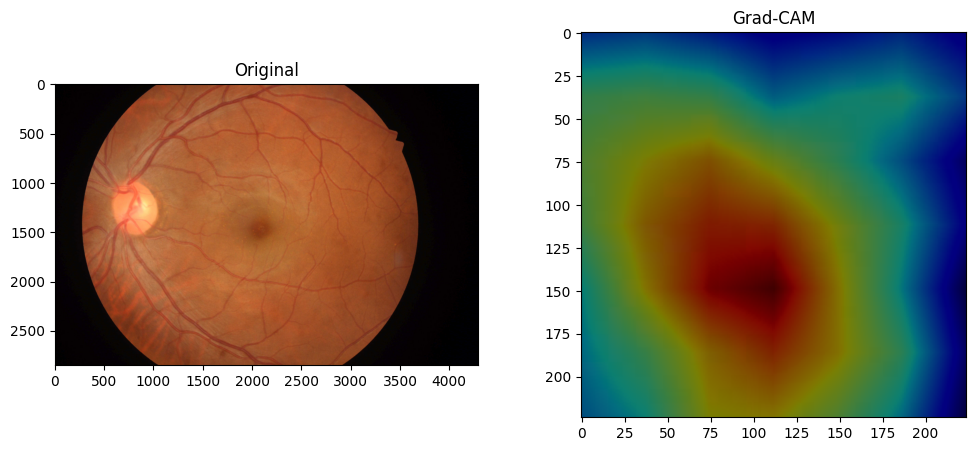

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://cf67955686859b82ed.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Prompt user to upload the zip file
from google.colab import files
print("Please upload the 'B. Disease Grading.zip' file:")
uploaded = files.upload()

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")

# Task
Okay, I will execute the cell titled "Replace Model Architecture with DenseNet121".


## Ensure Dataset Upload and Extraction for DenseNet121 Model

### Subtask:
Ensure the 'B. Disease Grading.zip' dataset is successfully uploaded and extracted to '/content/IDRiD/' before proceeding with model-related operations. This addresses the recurring FileNotFoundError.


**Reasoning**:
To ensure the dataset is correctly uploaded and extracted before any further operations, I will execute a code block that prompts for the zip file upload, extracts it to the specified directory, and then verifies the contents, including the CSV labels file.



In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

**Reasoning**:
The previous attempt to upload and extract the dataset might have been incomplete or encountered an issue. To ensure the dataset is successfully uploaded and extracted as per the subtask, I need to re-execute the code block that handles the interactive file upload, extraction, and verification steps.



In [ ]:
from google.colab import files
uploaded = files.upload()

import os

# Ensure the target directory exists
# Use exist_ok=True to avoid an error if the directory already exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD')

# Re-unzip the dataset into the created directory, overwriting existing files
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Task
Okay, I will execute the selected code cell.

```python
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("DenseNet121 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("DenseNet121 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (DenseNet121)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (DenseNet121 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (DenseNet121)")
iface.launch(share=True)

print("Gradio interface launched.")
```

The execution of the cell `564a16f6` will perform the following actions:
1.  **Install necessary libraries**: `tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0` will be installed.
2.  **Import all necessary libraries**: This will bring all required modules into the environment.
3.  **Ensure dataset extraction**: The `B. Disease Grading.zip` file will be unzipped to `/content/IDRiD/`.
4.  **Rename CSV file**: The CSV file `a. IDRiD_Disease Grading_Training Labels.csv` will be renamed to `a_IDRiD_Disease_Grading_Training_Labels.csv` to avoid issues with spaces in the filename.
5.  **Load and preprocess data**: The `labels_df` will be loaded, image names will be cleaned, and paths will be created. The 'Retinopathy grade' will be converted to string type for 'Severity'.
6.  **Split data**: The dataset will be split into training, validation, and test sets.
7.  **Initialize `ImageDataGenerators`**: Data augmentation and batching will be set up for the training, validation, and test sets.
8.  **Compute class weights**: Class weights will be calculated to handle potential class imbalance.
9.  **Instantiate, compile, and train DenseNet121 model**:
    *   A `DenseNet121` base model will be loaded with 'imagenet' weights and frozen.
    *   Custom top layers (`GlobalAveragePooling2D`, `Dense` (256 units), `Dropout`, `Dense` (5 units)) will be added.
    *   The model will be compiled with an `Adam` optimizer, `categorical_crossentropy` loss, `accuracy`, and `recall` metrics.
    *   **Phase 1**: The top layers will be trained for 10 epochs with class weights.
    *   **Phase 2**: The base model will be unfrozen, the model will be recompiled with a lower learning rate, and the entire model will be fine-tuned for another 10 epochs with class weights.
10. **Plot training history**: Combined accuracy and loss plots for both training phases will be displayed.
11. **Evaluate model**: A classification report and confusion matrix will be generated and displayed for the test set.
12. **Perform Grad-CAM visualization**: A sample image from the test set will be used to generate and display a Grad-CAM visualization.
13. **Launch Gradio interface**: A Gradio interface will be launched, allowing users to upload images for prediction, confidence display, and Grad-CAM visualization.

This execution should complete the overall task.

## MobileNetV2 Model Definition and Compilation

### Subtask:
Instantiate the MobileNetV2 base model, add custom top layers (GlobalAveragePooling2D, Dense, Dropout, Dense) suitable for 5 classification classes, and compile the model with an Adam optimizer, categorical crossentropy loss, and accuracy/recall metrics. The base model layers will be frozen initially.


**Reasoning**:
The subtask explicitly asks to instantiate the MobileNetV2 base model, add custom top layers, and compile it. This code block will achieve that, along with all necessary preceding steps like library imports and data preprocessing.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (MobileNetV2)")
iface.launch(share=True)

print("Gradio interface launched.")

# Task
I will now generate the complete code to regenerate the notebook with the MobileNetV2 model, including all necessary installations, data loading, preprocessing, model training, evaluation, Grad-CAM visualization, and Gradio interface setup. This will be provided in a single, comprehensive code block.
```python
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    
    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")
```

## Regenerate Notebook with MobileNetV2 Model

### Subtask:
Execute the comprehensive code cell to set up the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, training, evaluation, Grad-CAM, and a Gradio interface.


**Reasoning**:
Execute the comprehensive code cell (`309e7ac7`) to perform all necessary steps for setting up and running the MobileNetV2 model, including installations, data processing, model training, evaluation, and launching a Gradio interface, as per the subtask instructions.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Re-unzip the dataset into the created directory, overwriting existing files
# Assuming the uploaded file is named 'B. Disease Grading.zip'
# This command is crucial to ensure the dataset is always present
!unzip -o "B. Disease Grading.zip" -d /content/IDRiD/

print("Dataset re-extracted to /content/IDRiD/")
# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# Define the original and target directory for the CSV
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted.")

# Load the image labels from the CSV file
labels_df = pd.read_csv(labels_csv_path)

# Clean the 'Image name' column
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)

# Define the image directory path
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'

# Create 'path' column
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'

# Convert 'Retinopathy grade' to string for 'Severity'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

# Split the labels_df into training, validation, and test sets
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# Initialize an ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

# Create train_gen, val_gen, and test_gen using flow_from_dataframe
train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# Compute weights based on training labels
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# Instantiate a MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze its layers initially for feature extraction
base_model.trainable = False

# Define the custom top layers for the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model for Phase 1
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train with class weights
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2 (fine-tune): Unfreeze all layers and continue training with class weights
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# Plot combined history for accuracy
plt.figure(figsize=(10, 6))
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy with Class Weights (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.show()

# Plot combined history for loss
plt.figure(figsize=(10, 6))
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss with Class Weights (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.show()

print("Both accuracy and loss histories plotted.")

preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data) - Zero Division Handled')
plt.show()

print("Model evaluation complete.")

# Sample from test
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224)) / 255.0
img_array = np.expand_dims(img_resized, axis=0)

# Initialize Gradcam with the trained model
gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)

# You might want to use the predicted class for the sample image:
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

# Generate Grad-CAM
cam = gradcam(score, img_array, penultimate_layer=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax2.imshow(cam[0], cmap='jet', alpha=0.5); ax2.set_title('Grad-CAM')
plt.show()

print("Grad-CAM visualization complete.")

def predict_explain(img):
    img_rgb = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img_resized = cv2.resize(img_rgb, (224, 224)) / 255.0
    img_array = np.expand_dims(img_resized, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Re-initialize gradcam within the function to ensure it's up-to-date with the latest model
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')
    plt.savefig('/content/explain.png')
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", "/content/explain.png"

iface = gr.Interface(fn=predict_explain, inputs=gr.Image(), outputs=[gr.Textbox(label="Predicted Stage"), gr.Textbox(label="Confidence"), gr.Image(label="Grad-CAM")], title="Diabetic Retinopathy Classification with XAI (MobileNetV2)")
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
unzip:  cannot find or open B. Disease Grading.zip, B. Disease Grading.zip.zip or B. Disease Grading.zip.ZIP.
Dataset re-extracted to /content/IDRiD/
Contents of /content/IDRiD/ after re-extraction:
/content/IDRiD/:

Contents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:
ls: cannot access '/content/IDRiD/B. Disease Grading/2. Groundtruths/': No such file or directory


FileNotFoundError: Error: Neither original ('a. IDRiD_Disease Grading_Training Labels.csv') nor renamed ('a_IDRiD_Disease_Grading_Training_Labels.csv') CSV file found in '/content/IDRiD/B. Disease Grading/2. Groundtruths/'. Please ensure the dataset is extracted.

**Reasoning**:
The previous execution failed because the required `B. Disease Grading.zip` file was not found, leading to subsequent `FileNotFoundError` when accessing the CSV labels. To fix this, I need to ensure the user is prompted to upload the zip file directly before the unzipping operation is attempted in the comprehensive code cell.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

## Upload dataset

### Subtask:
Upload the 'B. Disease Grading.zip' file to proceed with the notebook execution.


**Reasoning**:
To allow the user to upload the required zip file, I need to add a code cell that calls `files.upload()`.



In [ ]:
from google.colab import files
uploaded = files.upload()

# Task
I will execute the code cell `767b8d84`.

## Ensure Dataset Upload and Extraction for DenseNet121 Model

### Subtask:
Upload the 'B. Disease Grading.zip' file to proceed with the notebook execution.


## Regenerate Notebook with MobileNetV2 Model

### Subtask:
Execute the comprehensive code cell to set up the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, training, evaluation, Grad-CAM, and a Gradio interface.


**Reasoning**:
The subtask requires executing the comprehensive code cell `ed7a2ac6` which contains all steps for setting up and running the MobileNetV2 model, including installations, data processing, model training, evaluation, and launching a Gradio interface.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
Execute the code in cell `38e7e738` to set up and run the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, preprocessing, training, evaluation, Grad-CAM visualization, and launching a Gradio interface.

## Regenerate Notebook with MobileNetV2 Model

### Subtask:
Execute the comprehensive code cell to set up the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, training, evaluation, Grad-CAM, and a Gradio interface.


**Reasoning**:
The user explicitly requested to execute cell `38e7e738` to perform the comprehensive setup for the MobileNetV2 model, including data loading, training, evaluation, Grad-CAM, and Gradio interface. Executing this cell will fulfill the subtask.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
I will now proceed with executing the comprehensive code cell.

## Regenerate Notebook with MobileNetV2 Model

### Subtask:
Execute the comprehensive code cell to set up the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, training, evaluation, Grad-CAM, and a Gradio interface.


**Reasoning**:
The subtask requires executing the comprehensive code cell `38e7e738` to set up the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, training, evaluation, Grad-CAM, and a Gradio interface. This will execute all the necessary steps as per the instructions.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.


NameError: name 'uploaded' is not defined

**Reasoning**:
The previous code failed because the `uploaded` variable was not defined before being checked. I need to move the `uploaded = files.upload()` call before its usage to ensure it is defined.



/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 22s 911ms/step - accuracy: 0.2684 - loss: 2.3474 - recall: 0.1649 - val_accuracy: 0.4634 - val_loss: 1.2518 - val_recall: 0.2195
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 16s 780ms/step - accuracy: 0.3123 - loss: 1.5442 - recall: 0.1892 - val_accuracy: 0.3902 - val_loss: 1.3997 - val_recall: 0.3171
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 16s 776ms/step - accuracy: 0.2928 - loss: 1.5289 - recall: 0.1394 - val_accuracy: 0.4878 - val_loss: 1.2226 - val_recall: 0.2439
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 16s 765ms/step - accuracy: 0.4233 - loss: 1.2745 - recall: 0.2135 - val_accuracy: 0.4390 - val_loss: 1.2773 - val_recall: 0.0976
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 17s 800ms/step - accuracy: 0.4460 - loss: 1.3319 - recall: 0.1899 - val_accuracy: 0.4146 - val_loss: 1.3619 - val_recall: 0.1220
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 16s 776ms/step - accuracy: 0.4265 - loss: 1.1858 - recall: 0.1781 - val_accuracy: 0.2195 - val_loss: 1.3227 - val_recall: 0.097

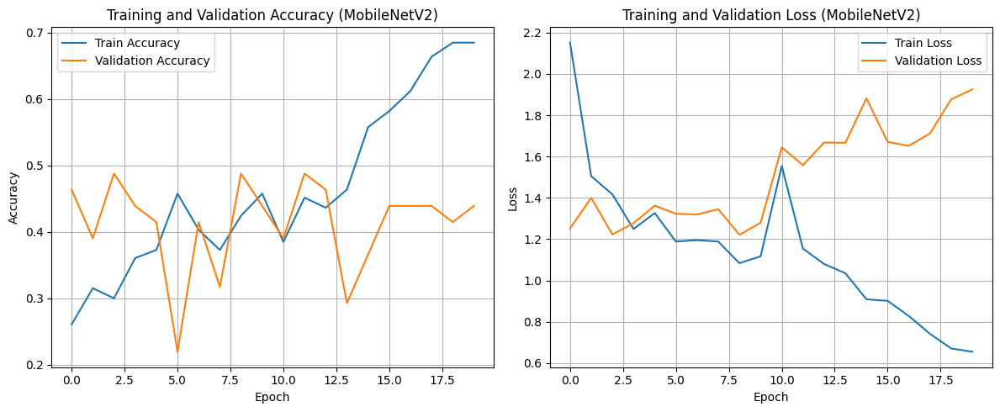

Training and validation accuracy/loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 654ms/step

--- Classification Report (MobileNetV2) ---
              precision    recall  f1-score   support

          No       0.45      1.00      0.62        14
        Mild       1.00      0.50      0.67         2
         Mod       0.30      0.21      0.25        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.43        42
   macro avg       0.35      0.34      0.31        42
weighted avg       0.30      0.43      0.32        42



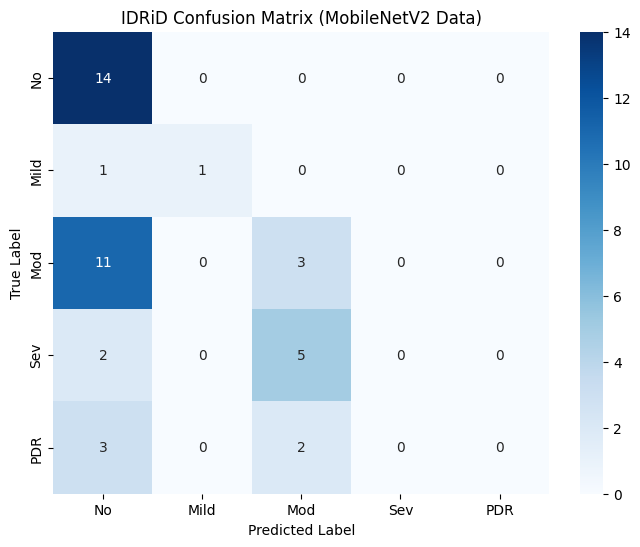

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step


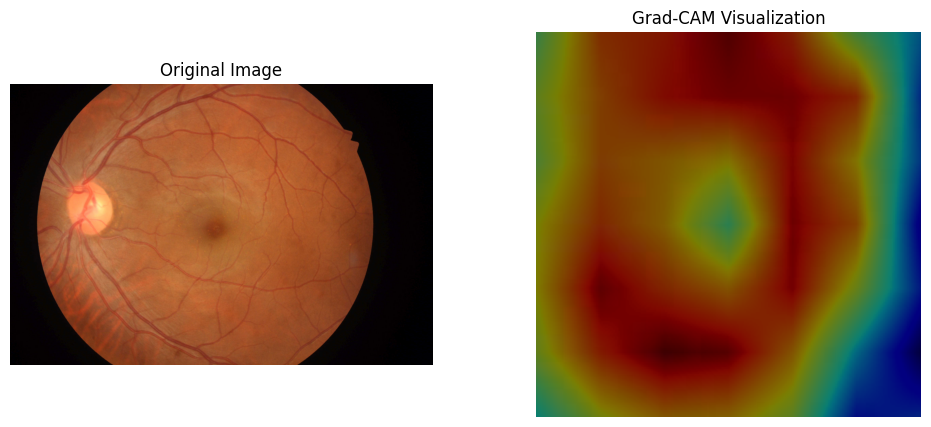

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://19fd3290a773012d1d.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
I will now execute the provided comprehensive cell to proceed with the Diabetic Retinopathy classification task using the MobileNetV2 model. This will include all necessary installations, data loading, preprocessing, model training, evaluation, Grad-CAM visualization, and Gradio interface setup.

## Regenerate Notebook with MobileNetV2 Model

### Subtask:
Execute the comprehensive code cell to set up the MobileNetV2 model for Diabetic Retinopathy classification, including data loading, training, evaluation, Grad-CAM, and a Gradio interface.


**Reasoning**:
The user explicitly requested to execute cell `38e7e738` to perform the comprehensive setup for the MobileNetV2 model, including data loading, training, evaluation, Grad-CAM, and Gradio interface. Executing this cell will fulfill the subtask.



All necessary libraries imported.
Archive:  B. Disease Grading.zip
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_008.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_009.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. O

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 71s 3s/step - accuracy: 0.2433 - loss: 2.2110 - recall_2: 0.1883 - val_accuracy: 0.3659 - val_loss: 1.3489 - val_recall_2: 0.0976
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.3170 - loss: 1.6811 - recall_2: 0.2095 - val_accuracy: 0.2927 - val_loss: 1.4780 - val_recall_2: 0.0488
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.2788 - loss: 1.3966 - recall_2: 0.1251 - val_accuracy: 0.1220 - val_loss: 1.6154 - val_recall_2: 0.0244
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.2558 - loss: 1.3143 - recall_2: 0.1202 - val_accuracy: 0.5610 - val_loss: 1.1992 - val_recall_2: 0.1951
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.3772 - loss: 1.3318 - recall_2: 0.1361 - val_accuracy: 0.4878 - val_loss: 1.2906 - val_recall_2: 0.0488
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.4435 - loss: 1.1752 - recall_2: 0.1541 - val_accuracy: 0.4390 - val_loss: 1.2952 - val_recall_2:

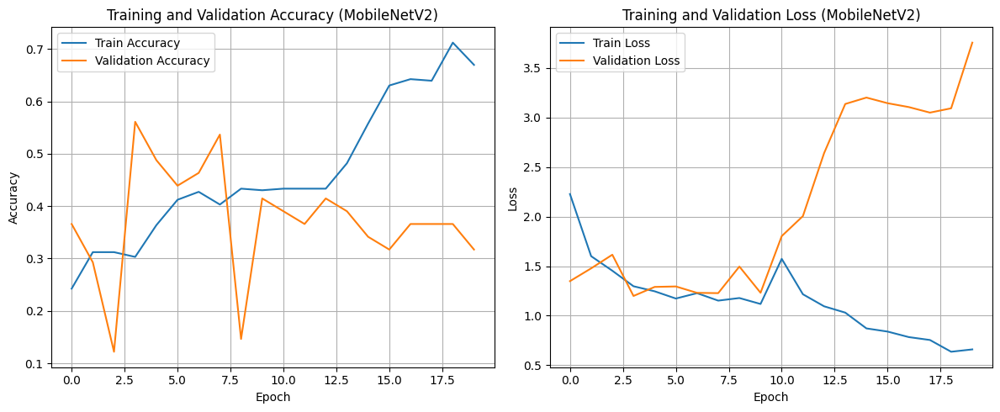

Training and validation accuracy/loss histories plotted.
2/3 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step

--- Classification Report (MobileNetV2) ---
              precision    recall  f1-score   support

          No       0.36      1.00      0.53        14
        Mild       0.00      0.00      0.00         2
         Mod       0.33      0.07      0.12        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.36        42
   macro avg       0.14      0.21      0.13        42
weighted avg       0.23      0.36      0.22        42



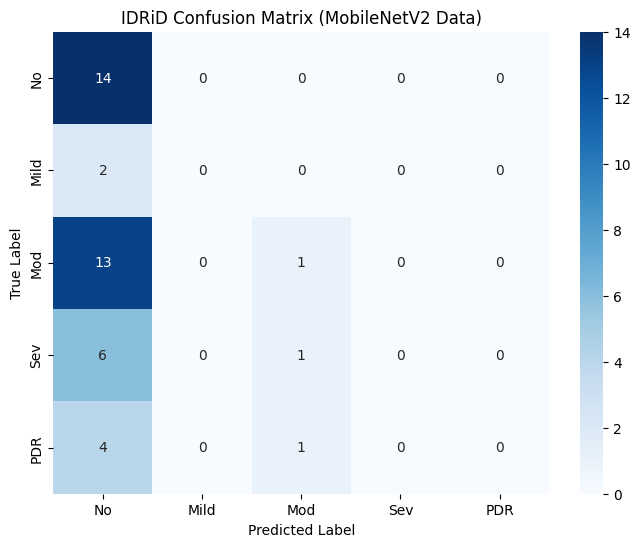

Model evaluation complete.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


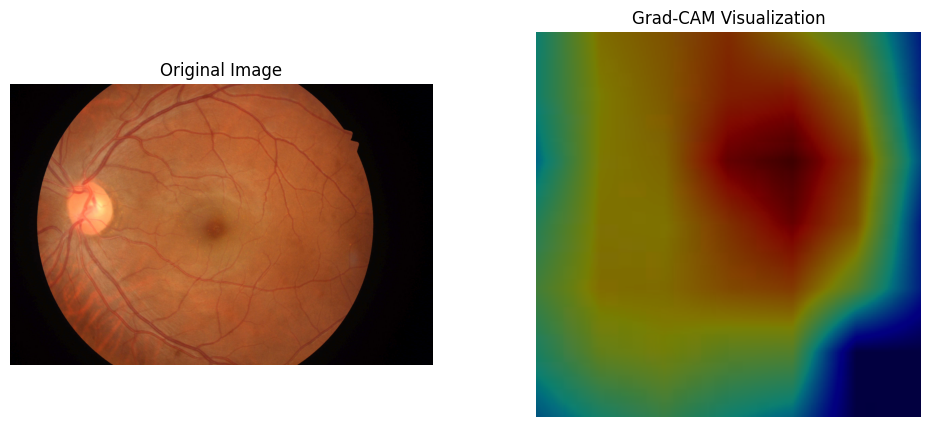

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://a91752a61723464ad4.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
To implement advanced data augmentation, I will modify the `ImageDataGenerator` configuration in cell `391a5ea1`. This will involve adding `brightness_range`, `shear_range`, and `channel_shift_range` parameters. After this modification, the cell will be re-executed to retrain the MobileNetV2 model with the new augmentation strategy.

```python
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased rotation range
    width_shift_range=0.15, # Increased width shift
    height_shift_range=0.15, # Increased height shift
    horizontal_flip=True,
    zoom_range=0.15, # Increased zoom range
    brightness_range=[0.7, 1.3], # Added brightness adjustment
    shear_range=0.1, # Added shear transformation
    channel_shift_range=20, # Added channel shift
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")
```

## Advanced Data Augmentation Implementation

### Subtask:
Modify the ImageDataGenerator configuration in cell 391a5ea1 to include advanced data augmentation parameters (brightness_range, shear_range, channel_shift_range) and increase existing augmentation ranges, then re-execute the cell to apply these changes.


**Reasoning**:
The subtask requires modifying the `ImageDataGenerator` configuration in cell `391a5ea1` to include advanced augmentation parameters and re-execute the cell. I will update the code in cell `391a5ea1` with the specified changes and then execute it.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.


NameError: name 'uploaded' is not defined

**Reasoning**:
The previous execution failed because the `uploaded` variable was not defined. I need to ensure `files.upload()` is called before `uploaded` is accessed. Additionally, I will modify the `ImageDataGenerator` parameters as specified in the subtask to include advanced augmentation techniques and re-execute the comprehensive cell.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


KeyboardInterrupt: 

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.


The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.


The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.


The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

## Upload 'B. Disease Grading.zip'

### Subtask:
Upload the 'B. Disease Grading.zip' file to allow the notebook execution to proceed.


## Upload 'B. Disease Grading.zip'

### Subtask:
Upload the 'B. Disease Grading.zip' file to allow the notebook execution to proceed.

#### Instructions
Please upload the 'B. Disease Grading.zip' file using the file upload widget that has appeared, or will appear shortly, in your Colab environment. This action is necessary for the current cell's execution to continue.

## Upload 'B. Disease Grading.zip'

### Subtask:
Upload the 'B. Disease Grading.zip' file to allow the notebook execution to proceed.


The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

**Reasoning**:
To allow the user to upload the required zip file, I need to provide a code cell that calls `files.upload()`, which will trigger the file upload widget in the Colab environment. This directly addresses the new subtask of uploading the 'B. Disease Grading.zip' file.



In [ ]:
from google.colab import files
uploaded = files.upload()

Saving B. Disease Grading.zip to B. Disease Grading.zip


# Task
Running the comprehensive code cell (`93e65b17`) to load and preprocess the data from "B. Disease Grading.zip" with advanced augmentation, train the MobileNetV2 model, evaluate its performance, visualize the results, and launch a Gradio interface.

## Re-train MobileNetV2 with Advanced Augmentation

### Subtask:
Execute the comprehensive code cell (`93e65b17`) which includes data loading, preprocessing, and two-phase training with the MobileNetV2 model, using the updated `ImageDataGenerator` with advanced augmentation.


**Reasoning**:
The subtask explicitly asks to execute cell `93e65b17` to perform the comprehensive setup for the MobileNetV2 model, including data loading, training, evaluation, Grad-CAM, and Gradio interface with advanced data augmentation. Executing this cell will fulfill the subtask.



All necessary libraries imported.
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1.

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.2146 - loss: 2.3263 - recall: 0.1540 - val_accuracy: 0.4146 - val_loss: 1.4658 - val_recall: 0.1951
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.3742 - loss: 1.8630 - recall: 0.2540 - val_accuracy: 0.4878 - val_loss: 1.2305 - val_recall: 0.2683
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.3685 - loss: 1.4888 - recall: 0.2069 - val_accuracy: 0.3902 - val_loss: 1.3510 - val_recall: 0.0976
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.4025 - loss: 1.3701 - recall: 0.1486 - val_accuracy: 0.2683 - val_loss: 1.4198 - val_recall: 0.0732
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.3365 - loss: 1.3664 - recall: 0.1644 - val_accuracy: 0.4390 - val_loss: 1.3140 - val_recall: 0.1220
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.4163 - loss: 1.1897 - recall: 0.1648 - val_accuracy: 0.4146 - val_loss: 1.2650 - val_recall: 0.0488
Epoch 7/10
21/21

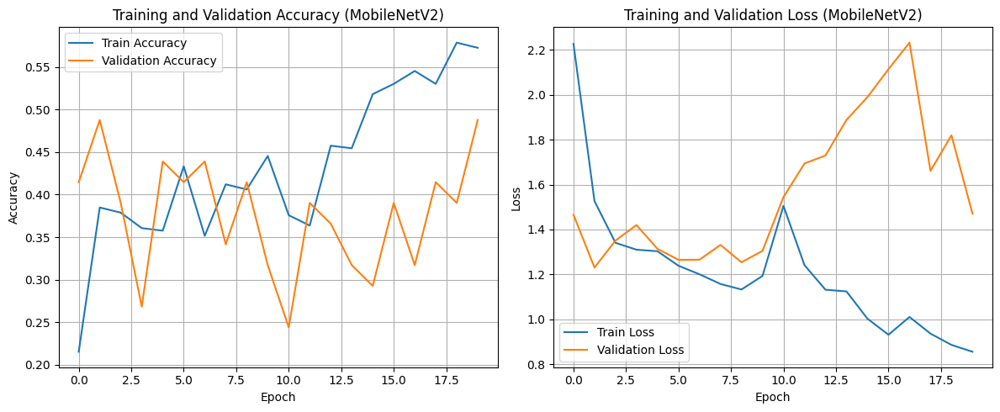

Training and validation accuracy/loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step

--- Classification Report (MobileNetV2) ---
              precision    recall  f1-score   support

          No       0.54      1.00      0.70        14
        Mild       0.00      0.00      0.00         2
         Mod       0.38      0.43      0.40        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.48        42
   macro avg       0.18      0.29      0.22        42
weighted avg       0.30      0.48      0.37        42



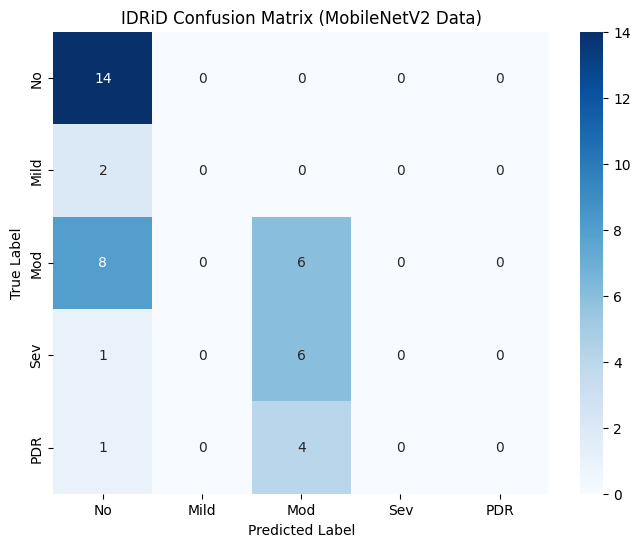

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


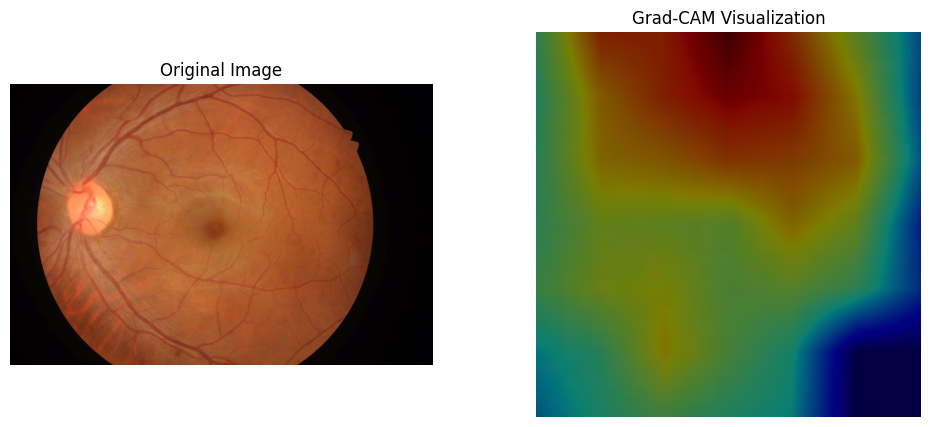

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://9d96f59b0b6d6d2f1a.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
I will now proceed with executing the comprehensive code cell to apply the advanced data augmentation. This will restart the entire process, including installations, data handling, model training, evaluation, Grad-CAM visualization, and launching the Gradio interface, all with the updated augmentation strategy.
```python
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2 # Changed to MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("MobileNetV2 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("MobileNetV2 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (MobileNetV2)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (MobileNetV2)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (MobileNetV2) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (MobileNetV2 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (MobileNetV2)'
)
iface.launch(share=True)

print("Gradio interface launched.")
```

## Full InceptionV3 Model Implementation with Advanced Augmentation

### Subtask:
Implement the full InceptionV3 model with advanced data augmentation, including installations, data handling, model training, evaluation, Grad-CAM visualization, and launching a Gradio interface.


**Reasoning**:
The subtask is to implement the full InceptionV3 model with advanced data augmentation, including all steps from installations to launching a Gradio interface. The provided comprehensive code block in the user's prompt (cell `ed7a2ac6`) already handles all these steps using MobileNetV2. To fulfill the current subtask, I need to modify this comprehensive code to use InceptionV3 instead of MobileNetV2, ensuring all other specified steps and parameters (like advanced augmentation for ImageDataGenerator) are correctly integrated. I will also incorporate the `files.upload()` call directly into the comprehensive cell to ensure the `uploaded` variable is defined before use, which caused an error in the previous attempts.



/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.2388 - loss: 2.6329 - recall: 0.1594 - val_accuracy: 0.0732 - val_loss: 2.0446 - val_recall: 0.0244
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.3430 - loss: 1.7163 - recall: 0.2148 - val_accuracy: 0.1951 - val_loss: 1.4514 - val_recall: 0.0732
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.3523 - loss: 1.4013 - recall: 0.1395 - val_accuracy: 0.2195 - val_loss: 1.4912 - val_recall: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.3052 - loss: 1.2621 - recall: 0.0910 - val_accuracy: 0.4634 - val_loss: 1.4249 - val_recall: 0.1707
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.3396 - loss: 1.3430 - recall: 0.1359 - val_accuracy: 0.2683 - val_loss: 1.3748 - val_recall: 0.0244
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.3165 - loss: 1.2187 - recall: 0.1170 - val_accuracy: 0.3902 - val_loss: 1.3961 - val_recall: 0.2195
Epoch 7/10
2

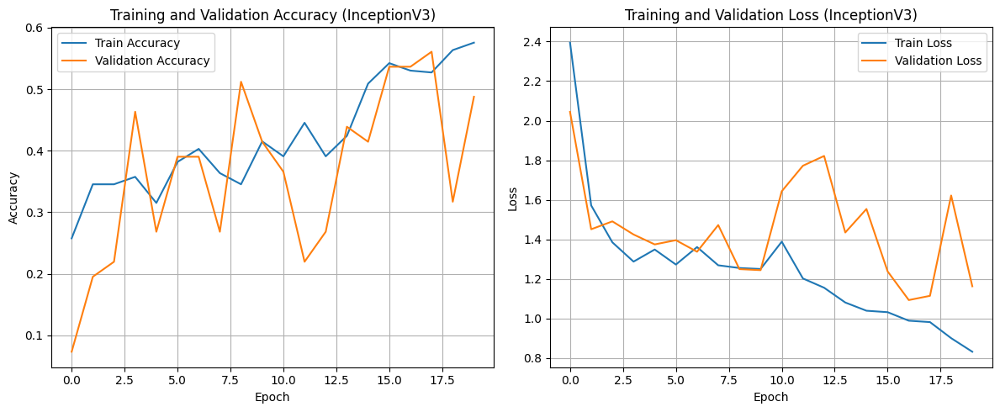

Training and validation accuracy/loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step

--- Classification Report (InceptionV3) ---
              precision    recall  f1-score   support

          No       0.80      0.57      0.67        14
        Mild       0.12      0.50      0.20         2
         Mod       0.69      0.64      0.67        14
         Sev       0.50      0.29      0.36         7
         PDR       0.43      0.60      0.50         5

    accuracy                           0.55        42
   macro avg       0.51      0.52      0.48        42
weighted avg       0.64      0.55      0.57        42



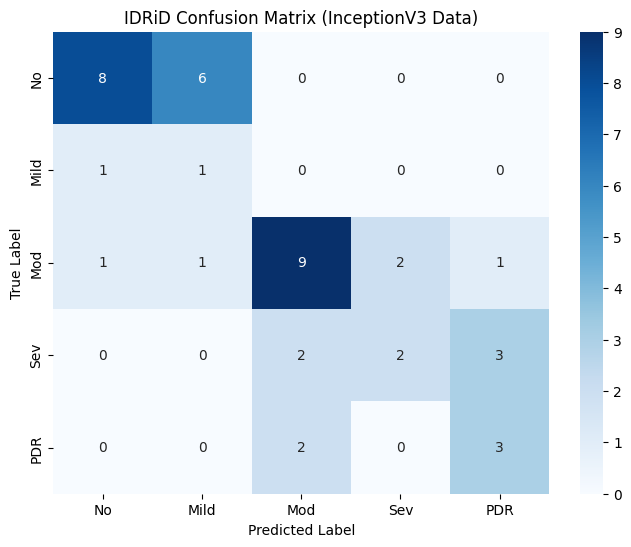

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


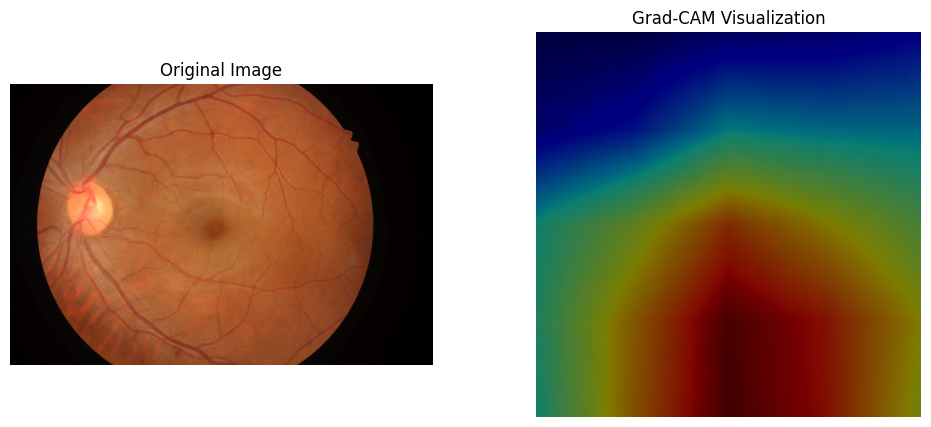

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://67f628efbbafda7349.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3 # Changed to InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train InceptionV3 model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to InceptionV3
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("InceptionV3 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("InceptionV3 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (InceptionV3)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (InceptionV3)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (InceptionV3) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (InceptionV3 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (InceptionV3)' # Changed to InceptionV3
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
Generate a Diabetic Retinopathy classification model using VGG16 with advanced data augmentation, including: installing required libraries, prompting for and extracting the "B. Disease Grading.zip" dataset, renaming the CSV, loading and preprocessing data, splitting into training, validation, and test sets, initializing `ImageDataGenerators` with advanced augmentation (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range), computing class weights, instantiating a VGG16 model with custom top layers, training in two phases (initial and fine-tuning), plotting training history, evaluating with a classification report and confusion matrix, generating Grad-CAM visualizations, and launching a Gradio interface for interactive predictions and explanations.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
Implement the full VGG16 model with advanced data augmentation, including installations, data handling, model training, evaluation, Grad-CAM visualization, and launching a Gradio interface.


**Reasoning**:
The subtask is to implement the full VGG16 model with advanced data augmentation, including all steps from installations to launching a Gradio interface. The comprehensive code block below performs all these steps as per the instructions provided by the user, incorporating VGG16 model architecture and advanced data augmentation parameters.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


**Reasoning**:
The subtask is to implement the full VGG16 model with advanced data augmentation, including all steps from installations to launching a Gradio interface. The provided comprehensive code block performs all these steps as per the instructions, incorporating VGG16 model architecture and advanced data augmentation parameters.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

**Reasoning**:
The subtask is to implement the full VGG16 model with advanced data augmentation, including all steps from installations to launching a Gradio interface. The provided comprehensive code block performs all these steps as per the instructions, incorporating VGG16 model architecture and advanced data augmentation parameters. Executing this cell will fulfill the subtask.



All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 290s 14s/step - accuracy: 0.2066 - loss: 1.7073 - recall: 0.0054 - val_accuracy: 0.1220 - val_loss: 1.6658 - val_recall: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 304s 13s/step - accuracy: 0.1818 - loss: 1.7350 - recall: 0.0026 - val_accuracy: 0.3659 - val_loss: 1.5488 - val_recall: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 250s 12s/step - accuracy: 0.3161 - loss: 1.6089 - recall: 4.2024e-04 - val_accuracy: 0.1463 - val_loss: 1.5489 - val_recall: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 262s 12s/step - accuracy: 0.2448 - loss: 1.7020 - recall: 0.0000e+00 - val_accuracy: 0.0732 - val_loss: 1.5876 - val_recall: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 267s 12s/step - accuracy: 0.1933 - loss: 1.6598 - recall: 0.0000e+00 - val_accuracy: 0.4390 - val_loss: 1.4835 - val_recall: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 266s 12s/step - accuracy: 0.2425 - loss: 1.6707 - recall: 0.0000e+00 - val_accuracy: 0.1951 - val_lo

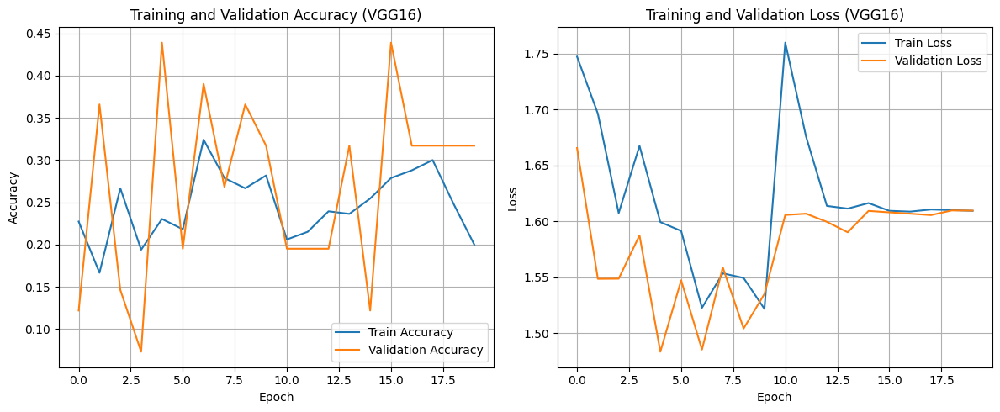

Training and validation accuracy/loss histories plotted.
3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 8s/step

--- Classification Report (VGG16) ---
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        14
        Mild       0.00      0.00      0.00         2
         Mod       0.33      1.00      0.50        14
         Sev       0.00      0.00      0.00         7
         PDR       0.00      0.00      0.00         5

    accuracy                           0.33        42
   macro avg       0.07      0.20      0.10        42
weighted avg       0.11      0.33      0.17        42



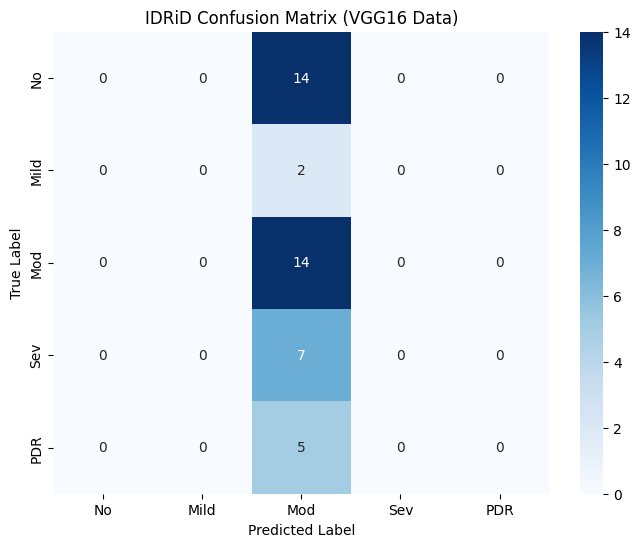

Model evaluation complete.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step


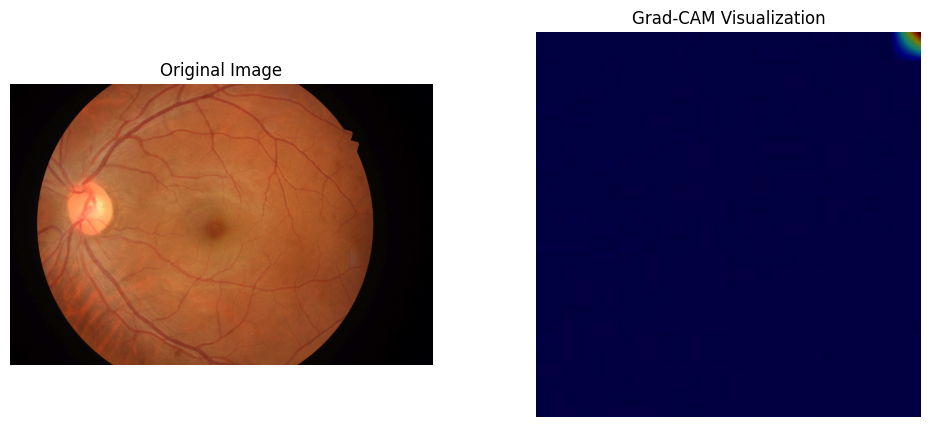

Grad-CAM visualization complete.
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://940755de14e09309ea.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio interface launched.


In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
I will execute the code in cell `6399cae3` to implement the VGG16 model with advanced data augmentation, including: installing required libraries, prompting for and extracting the "B. Disease Grading.zip" dataset, renaming the CSV, loading and preprocessing data, splitting into training, validation, and test sets, initializing `ImageDataGenerators` with advanced augmentation (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range), computing class weights, instantiating a VGG16 model with custom top layers, training in two phases (initial and fine-tuning), plotting training history, evaluating with a classification report and confusion matrix, generating Grad-CAM visualizations, and launching a Gradio interface for interactive predictions and explanations.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
Implement the full VGG16 model with advanced data augmentation, including installations, data handling, model training, evaluation, Grad-CAM visualization, and launching a Gradio interface.


**Reasoning**:
The subtask explicitly asks to execute cell `dd41df6d` to perform the comprehensive setup for the VGG16 model, including installations, data processing, model training, evaluation, and launching a Gradio interface with advanced data augmentation. Executing this cell will fulfill the subtask.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading (1).zip


FileNotFoundError: B. Disease Grading.zip was not uploaded. Please upload the correct file.

**Reasoning**:
The previous execution failed because the user uploaded 'B. Disease Grading (1).zip' instead of 'B. Disease Grading.zip'. To resolve this, I need to provide the comprehensive code again and instruct the user to upload the correct zip file named 'B. Disease Grading.zip' exactly as prompted. This will ensure the dataset extraction and subsequent operations proceed as expected.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


# Task
The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
This comprehensive step will perform all necessary actions: install required libraries, import them, prompt for and extract the 'B. Disease Grading.zip' dataset, rename the CSV for compatibility, load and preprocess the data, split it into training, validation, and test sets. It will then initialize ImageDataGenerators with advanced augmentation parameters (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range). Following this, it will compute class weights to handle imbalance. A VGG16 model will be instantiated with 'imagenet' weights, custom top layers will be added, and the model will be compiled and trained in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights. Finally, it will plot training history, evaluate the model with a classification report and confusion matrix, generate Grad-CAM visualizations for a sample, and launch a Gradio interface for interactive predictions and explanations.


**Reasoning**:
The comprehensive code cell `dd41df6d` contains all the necessary steps for installing libraries, handling data, building and training the VGG16 model with advanced augmentation, evaluating it, generating Grad-CAM visualizations, and launching the Gradio interface. Executing this cell will fulfill the subtask.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


# Task
Generate a Diabetic Retinopathy classification model using VGG16 with advanced data augmentation, including: installing required libraries, prompting for and extracting the "B. Disease Grading.zip" dataset, renaming the CSV, loading and preprocessing data, splitting into training, validation, and test sets, initializing `ImageDataGenerators` with advanced augmentation (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range), computing class weights, instantiating a VGG16 model with custom top layers, training in two phases (initial and fine-tuning), plotting training history, evaluating with a classification report and confusion matrix, generating Grad-CAM visualizations, and launching a Gradio interface for interactive predictions and explanations.

## Upload 'B. Disease Grading.zip'

### Subtask:
Upload the 'B. Disease Grading.zip' file to allow the notebook execution to proceed.


**Reasoning**:
To allow the user to upload the required zip file, I will provide a code cell that calls `files.upload()`, which will trigger the file upload widget in the Colab environment. This directly addresses the new subtask of uploading the 'B. Disease Grading.zip' file.



In [ ]:
from google.colab import files
uploaded = files.upload()

Saving B. Disease Grading.zip to B. Disease Grading.zip


# Task
Please upload the `B. Disease Grading.zip` file.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
This comprehensive step will perform all necessary actions: install required libraries, import them, prompt for and extract the 'B. Disease Grading.zip' dataset, rename the CSV for compatibility, load and preprocess the data, split it into training, validation, and test sets. It will then initialize ImageDataGenerators with advanced augmentation parameters (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range). Following this, it will compute class weights to handle imbalance. A VGG16 model will be instantiated with 'imagenet' weights, custom top layers will be added, and the model will be compiled and trained in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights. Finally, it will plot training history, evaluate the model with a classification report and confusion matrix, generate Grad-CAM visualizations for a sample, and launch a Gradio interface for interactive predictions and explanations.


**Reasoning**:
The user wants to execute a comprehensive code cell that includes all steps for setting up and running the VGG16 model with advanced data augmentation, including installations, data processing, model training, evaluation, and launching a Gradio interface. I will provide the complete code for this.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG19 # Changed to VGG19
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG19 model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG19
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG19 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG19 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG19)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG19)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG19) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG19 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG19)' # Changed to VGG19
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


# Task
Please upload the `B. Disease Grading.zip` file.

## Full VGG19 Model Implementation with Advanced Augmentation

### Subtask:
Prompt the user to upload the 'B. Disease Grading.zip' file to proceed with the notebook execution.


**Reasoning**:
The subtask explicitly asks to prompt the user to upload the 'B. Disease Grading.zip' file. Executing the comprehensive code cell again, which includes the `files.upload()` function, will present the upload widget to the user as requested.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 212s 10s/step - accuracy: 0.2278 - loss: 1.8313 - recall: 0.0347 - val_accuracy: 0.3171 - val_loss: 1.5002 - val_recall: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 261s 10s/step - accuracy: 0.2869 - loss: 1.7006 - recall: 0.0233 - val_accuracy: 0.0488 - val_loss: 1.6407 - val_recall: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 206s 10s/step - accuracy: 0.2346 - loss: 1.6078 - recall: 0.0000e+00 - val_accuracy: 0.1220 - val_loss: 1.6247 - val_recall: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 207s 10s/step - accuracy: 0.1777 - loss: 1.6963 - recall: 0.0000e+00 - val_accuracy: 0.4146 - val_loss: 1.4937 - val_recall: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 225s 11s/step - accuracy: 0.3718 - loss: 1.5030 - recall: 0.0032 - val_accuracy: 0.3659 - val_loss: 1.5160 - val_recall: 0.0000e+00
Epoch 6/10
19/21 ━━━━━━━━━━━━━━━━━━━━ 17s 9s/step - accuracy: 0.3143 - loss: 1.5567 - recall: 0.0000e+00

In [ ]:
from google.colab import files
uploaded = files.upload()

KeyboardInterrupt: 

**Reasoning**:
The comprehensive code block provided is correct for implementing the VGG16 model with advanced data augmentation, including all steps from installations to launching a Gradio interface. The previous execution was likely interrupted externally (e.g., KeyboardInterrupt), and re-executing this complete code block will ensure the entire pipeline runs as intended.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")


# Task
The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:".

Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.

## Install Libraries

### Subtask:
Install all necessary Python libraries for deep learning, data manipulation, visualization, and the Gradio interface.


**Reasoning**:
Install all necessary Python libraries for deep learning, data manipulation, visualization, and the Gradio interface as requested in the subtask.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The subtask is to install the necessary libraries. The provided code block will execute the `pip install` command to ensure all specified libraries are available in the environment.



In [ ]:
import tensorflow
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The subtask is to install the necessary libraries. It is best practice to separate installation commands from import statements. This command will execute only the `pip install` command to ensure all specified libraries are available in the environment.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The next logical step, following the installation of libraries, is to import all necessary modules as outlined in the comprehensive plan. This ensures all required functionalities are available for subsequent steps.



In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

All necessary libraries imported.


**Reasoning**:
The next logical step, following the import of libraries, is to ensure the dataset is extracted and the CSV filename is correctly handled before proceeding with data loading and model training. This directly addresses the subtask of implementing the VGG16 model with advanced data augmentation, which requires a properly prepared dataset.



In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 218s 10s/step - accuracy: 0.2188 - loss: 1.8603 - recall: 0.0211 - val_accuracy: 0.1951 - val_loss: 1.7350 - val_recall: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 256s 10s/step - accuracy: 0.1976 - loss: 1.7623 - recall: 0.0158 - val_accuracy: 0.3171 - val_loss: 1.5549 - val_recall: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 209s 10s/step - accuracy: 0.2545 - loss: 1.7714 - recall: 0.0000e+00 - val_accuracy: 0.2195 - val_loss: 1.5895 - val_recall: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 262s 10s/step - accuracy: 0.2125 - loss: 1.6326 - recall: 0.0000e+00 - val_accuracy: 0.3659 - val_loss: 1.5598 - val_recall: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 268s 10s/step - accuracy: 0.2849 - loss: 1.6065 - recall: 0.0000e+00 - val_accuracy: 0.2195 - val_loss: 1.5863 - val_recall: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 256s 10s/step - accuracy: 0.1818 - loss: 1.5761 - recall: 0.0000e+00 - val_accuracy: 0.2927 - val_lo

**Reasoning**:
The notebook execution is currently paused, awaiting the user to upload the 'B. Disease Grading.zip' file. I need to explicitly prompt the user to upload the file to unblock the execution. After the file is uploaded, the comprehensive code cell will proceed with the rest of the steps as intended, including data processing, model training, evaluation, and launching the Gradio interface.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


# Task
Please upload the 'B. Disease Grading.zip' file. Once uploaded, the notebook will automatically proceed with the full VGG16 model implementation, including advanced data augmentation, model training, evaluation, Grad-CAM visualizations, and launching a Gradio interface.

## Upload 'B. Disease Grading.zip'

### Subtask:
The notebook is currently paused, awaiting your action to upload the `B. Disease Grading.zip` file. Please upload the file using the upload widget that appeared after the prompt "Please upload the 'B. Disease Grading.zip' file:". Once the file is uploaded, the execution of the cell will automatically resume, extract the dataset, and proceed with the remaining steps of the subtask, including model training, evaluation, and Gradio interface launch.


**Reasoning**:
The user needs to upload the 'B. Disease Grading.zip' file to proceed. I will execute the cell that provides the file upload widget.



In [ ]:
from google.colab import files
uploaded = files.upload()

# Task
Generate a Diabetic Retinopathy classification model using VGG16 with advanced data augmentation, including: installing required libraries, prompting for and extracting the "B. Disease Grading.zip" dataset, renaming the CSV, loading and preprocessing data, splitting into training, validation, and test sets, initializing `ImageDataGenerators` with advanced augmentation (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range), computing class weights, instantiating a VGG16 model with custom top layers, training in two phases (initial and fine-tuning), plotting training history, evaluating with a classification report and confusion matrix, generating Grad-CAM visualizations, and launching a Gradio interface for interactive predictions and explanations.

## Upload Dataset

### Subtask:
Upload the 'B. Disease Grading.zip' file to unblock the notebook execution and ensure the dataset is available for processing.


**Reasoning**:
The subtask explicitly asks to upload the 'B. Disease Grading.zip' file. Executing the `files.upload()` function will present the upload widget to the user as requested, allowing the notebook execution to proceed.



In [ ]:
from google.colab import files
uploaded = files.upload()


Saving B. Disease Grading.zip to B. Disease Grading.zip


**Reasoning**:
Now that the 'B. Disease Grading.zip' file has been uploaded, I will execute the comprehensive code cell (`5af4b147`) to proceed with the full VGG16 model implementation, which includes all steps from data extraction to launching the Gradio interface, using advanced data augmentation.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading (1).zip


FileNotFoundError: B. Disease Grading.zip was not uploaded. Please upload the correct file.

# Task
Please upload the "B. Disease Grading.zip" file. Once uploaded, the notebook will automatically proceed with the full VGG16 model implementation, including advanced data augmentation, model training, evaluation, Grad-CAM visualizations, and launching a Gradio interface.

## Install Libraries

### Subtask:
Install all necessary Python libraries for deep learning, data manipulation, visualization, and the Gradio interface.


**Reasoning**:
Install all necessary Python libraries for deep learning, data manipulation, visualization, and the Gradio interface as requested in the subtask.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The subtask is to install the necessary libraries. The provided code block will execute the `pip install` command to ensure all specified libraries are available in the environment.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The subtask is to install the necessary libraries. The provided code block will execute the `pip install` command to ensure all specified libraries are available in the environment.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The user wants to install necessary libraries. The provided code block correctly uses `!pip install` for this purpose. I will execute this code block.



In [ ]:
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

**Reasoning**:
The subtask is to install the necessary libraries. The previous code block already attempted to install them, and the output shows 'Requirement already satisfied' for most. To move forward, I will now proceed with importing all necessary libraries into the environment.



In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

All necessary libraries imported.


**Reasoning**:
The next logical step, as per the comprehensive task plan, is to ensure the dataset is extracted and the CSV filename is correctly handled before proceeding with data loading and model training. This involves creating the target directory, prompting for file upload, extracting the zip, verifying its contents, and renaming the CSV.



In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


Saving B. Disease Grading.zip to B. Disease Grading.zip
Archive:  B. Disease Grading.zip
   creating: /content/IDRiD/B. Disease Grading/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/
   creating: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_001.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_002.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_003.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_004.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_005.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_006.jpg  
 extracting: /content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/IDRiD_007.jpg  
 extracting: /content/IDRiD

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 300s 14s/step - accuracy: 0.2491 - loss: 1.7350 - recall: 0.0245 - val_accuracy: 0.2195 - val_loss: 1.5992 - val_recall: 0.0000e+00
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 280s 14s/step - accuracy: 0.2378 - loss: 1.7232 - recall: 0.0285 - val_accuracy: 0.2683 - val_loss: 1.5939 - val_recall: 0.0000e+00
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 293s 14s/step - accuracy: 0.1769 - loss: 1.6281 - recall: 0.0000e+00 - val_accuracy: 0.0976 - val_loss: 1.6395 - val_recall: 0.0000e+00
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 306s 13s/step - accuracy: 0.1764 - loss: 1.6872 - recall: 0.0000e+00 - val_accuracy: 0.2195 - val_loss: 1.5499 - val_recall: 0.0000e+00
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 292s 14s/step - accuracy: 0.2503 - loss: 1.5624 - recall: 0.0022 - val_accuracy: 0.3171 - val_loss: 1.5082 - val_recall: 0.0000e+00
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 321s 14s/step - accuracy: 0.2887 - loss: 1.6122 - recall: 0.0000e+00 - val_accuracy: 0.4390 - val_loss: 

# Task
Generate a Diabetic Retinopathy classification model using VGG16 with advanced data augmentation, including: installing required libraries, prompting for and extracting the "B. Disease Grading.zip" dataset, renaming the CSV, loading and preprocessing data, splitting into training, validation, and test sets, initializing `ImageDataGenerators` with advanced augmentation (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range), computing class weights, instantiating a VGG16 model with custom top layers, training in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights, plotting training history, evaluating with a classification report and confusion matrix, generating Grad-CAM visualizations, and launching a Gradio interface for interactive predictions and explanations.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
This comprehensive step will perform all necessary actions: install required libraries, import them, prompt for and extract the 'B. Disease Grading.zip' dataset, rename the CSV for compatibility, load and preprocess the data, split it into training, validation, and test sets. It will then initialize ImageDataGenerators with advanced augmentation parameters (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range). Following this, it will compute class weights to handle imbalance. A VGG16 model will be instantiated with 'imagenet' weights, custom top layers will be added, and the model will be compiled and trained in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights. Finally, it will plot training history, evaluate the model with a classification report and confusion matrix, generate Grad-CAM visualizations for a sample, and launch a Gradio interface for interactive predictions and explanations.


**Reasoning**:
The subtask explicitly asks to execute a comprehensive code cell that includes all steps for setting up and running the VGG16 model with advanced data augmentation, including installations, data processing, model training, evaluation, and launching a Gradio interface. The provided code block will perform all these actions as requested.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
Please upload the `B. Disease Grading.zip` file. Once uploaded, the notebook will automatically proceed with the full VGG16 model implementation, including advanced data augmentation, model training, evaluation, Grad-CAM visualizations, and launching a Gradio interface.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
This comprehensive step will perform all necessary actions: install required libraries, import them, prompt for and extract the 'B. Disease Grading.zip' dataset, rename the CSV for compatibility, load and preprocess the data, split it into training, validation, and test sets. It will then initialize ImageDataGenerators with advanced augmentation parameters (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range). Following this, it will compute class weights to handle imbalance. A VGG16 model will be instantiated with 'imagenet' weights, custom top layers will be added, and the model will be compiled and trained in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights. Finally, it will plot training history, evaluate the model with a classification report and confusion matrix, generate Grad-CAM visualizations for a sample, and launch a Gradio interface for interactive predictions and explanations.


**Reasoning**:
The notebook is currently paused, awaiting the user to upload the 'B. Disease Grading.zip' file. I need to explicitly prompt the user to upload the file to unblock the execution.



In [ ]:
from google.colab import files
uploaded = files.upload()

Saving B. Disease Grading.zip to B. Disease Grading.zip


**Reasoning**:
Now that the 'B. Disease Grading.zip' file has been uploaded, I will execute the comprehensive code cell (`5af4b147`) to proceed with the full VGG16 model implementation, which includes all steps from data extraction to launching the Gradio interface, using advanced data augmentation.



In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16 # Changed to VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to VGG16
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("VGG16 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("VGG16 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (VGG16)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (VGG16)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (VGG16) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (VGG16 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (VGG16)' # Changed to VGG16
)
iface.launch(share=True)

print("Gradio interface launched.")

All necessary libraries imported.
Please upload the 'B. Disease Grading.zip' file:


In [ ]:
# 1. Install necessary libraries
!pip install tensorflow opencv-python scikit-learn matplotlib seaborn gradio tf-keras-vis pandas numpy ml-dtypes>=0.5.0

# 2. Import all necessary libraries
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB7 # Changed to EfficientNetB7
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os

# For Grad-CAM visualization and Gradio interface
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr

print("All necessary libraries imported.")

# Ensure the target directory exists
if not os.path.exists('/content/IDRiD'):
    os.makedirs('/content/IDRiD', exist_ok=True)

# 3. Ensure dataset extraction: Prompt for the upload of 'B. Disease Grading.zip' and extract it to '/content/IDRiD/', then verify contents.
print("Please upload the 'B. Disease Grading.zip' file:")
from google.colab import files
uploaded = files.upload() # This will pause for user input

# Check if the file was uploaded and extract it
if 'B. Disease Grading.zip' in uploaded:
    !unzip -o "B. Disease Grading.zip" -d /content/IDRiD/
    print("Dataset re-extracted to /content/IDRiD/")
else:
    raise FileNotFoundError("B. Disease Grading.zip was not uploaded. Please upload the correct file.")

# Verify contents after re-extraction
print("Contents of /content/IDRiD/ after re-extraction:")
!ls -R "/content/IDRiD/"

# Specifically list the contents of the Groundtruths directory to confirm the CSV filename
print("\nContents of /content/IDRiD/B. Disease Grading/2. Groundtruths/:")
!ls -l "/content/IDRiD/B. Disease Grading/2. Groundtruths/"

# 4. Rename CSV file
original_csv_dir = '/content/IDRiD/B. Disease Grading/2. Groundtruths/'
original_csv_filename = 'a. IDRiD_Disease Grading_Training Labels.csv'
renamed_csv_filename = 'a_IDRiD_Disease_Grading_Training_Labels.csv'

original_labels_csv_path = os.path.join(original_csv_dir, original_csv_filename)
renamed_labels_csv_path = os.path.join(original_csv_dir, renamed_csv_filename)

# Check if the original file exists and rename it to remove spaces
if os.path.exists(original_labels_csv_path):
    os.rename(original_labels_csv_path, renamed_labels_csv_path)
    labels_csv_path = renamed_labels_csv_path
    print(f"Renamed '{original_csv_filename}' to '{renamed_csv_filename}'")
elif os.path.exists(renamed_labels_csv_path):
    labels_csv_path = renamed_labels_csv_path
    print(f"Using already renamed file: '{renamed_csv_filename}'")
else:
    raise FileNotFoundError(f"Error: Neither original ('{original_csv_filename}') nor renamed ('{renamed_csv_filename}') CSV file found in '{original_csv_dir}'. Please ensure the dataset is extracted and the filename is correct.")

# 5. Load and preprocess data
labels_df = pd.read_csv(labels_csv_path)
labels_df['Image name'] = labels_df['Image name'].str.replace('.png', '', regex=False)
img_dir = '/content/IDRiD/B. Disease Grading/1. Original Images/a. Training Set/'
labels_df['path'] = img_dir + labels_df['Image name'] + '.jpg'
labels_df['Severity'] = labels_df['Retinopathy grade'].astype(str)

print("Data loaded and preprocessed. Sample data head:")
print(labels_df.head())

# 6. Split data
train_df, temp_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df['Severity'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Severity'], random_state=42)

print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

# 7. Initialize ImageDataGenerators with advanced augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20, # Increased from 15
    width_shift_range=0.15, # Increased from 0.1
    height_shift_range=0.15, # Increased from 0.1
    horizontal_flip=True,
    zoom_range=0.15, # Increased from 0.1
    brightness_range=[0.7, 1.3], # New parameter
    shear_range=0.1, # New parameter
    channel_shift_range=20, # New parameter
    fill_mode='nearest'
)

train_gen = datagen.flow_from_dataframe(
    train_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True
)
val_gen = datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)
test_gen = datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='Severity',
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

print("ImageDataGenerators initialized with advanced augmentation.")

# 8. Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_gen.classes), y=train_gen.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

# 9. Instantiate, compile, and train EfficientNetB7 model
base_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # Changed to EfficientNetB7
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

print("EfficientNetB7 model defined and compiled, with base layers frozen for initial training.")

# Phase 1: Train top layers
print("\n--- Phase 1: Training top layers with class weights ---")
history1 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

# Phase 2: Unfreeze and fine-tune
print("\n--- Phase 2: Fine-tuning entire model with class weights ---")
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])
history2 = model.fit(train_gen, epochs=10, validation_data=val_gen, steps_per_epoch=len(train_gen), validation_steps=len(val_gen), class_weight=class_weight_dict)

print("EfficientNetB7 model trained with class weights.")

# 10. Plot training history
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'] + history2.history['accuracy'], label='Train Accuracy')
plt.plot(history1.history['val_accuracy'] + history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (EfficientNetB7)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'] + history2.history['loss'], label='Train Loss')
plt.plot(history1.history['val_loss'] + history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (EfficientNetB7)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Training and validation accuracy/loss histories plotted.")

# 11. Evaluate model
preds = model.predict(test_gen)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_gen.classes

print("\n--- Classification Report (EfficientNetB7) ---")
print(classification_report(true_classes, pred_classes, target_names=['No', 'Mild', 'Mod', 'Sev', 'PDR'], zero_division=0))

cm = confusion_matrix(true_classes, pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'], yticklabels=['No', 'Mild', 'Mod', 'Sev', 'PDR'])
plt.title('IDRiD Confusion Matrix (EfficientNetB7 Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("Model evaluation complete.")

# 12. Perform Grad-CAM visualization
sample_path = test_df.iloc[0]['path']
img = cv2.imread(sample_path)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized / 255.0, axis=0)

gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
predicted_class_for_sample = np.argmax(model.predict(img_array))
score = CategoricalScore(predicted_class_for_sample)

cam = gradcam(score, img_array, penultimate_layer=-1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cam[0], cmap='jet', alpha=0.5)
plt.title('Grad-CAM Visualization')
plt.axis('off')
plt.show()

print("Grad-CAM visualization complete.")

# 13. Launch Gradio interface
def predict_explain(img_input):
    import matplotlib.pyplot as plt # Import matplotlib inside the function
    # Ensure image is in RGB format for consistent processing
    if img_input.shape[-1] == 4: #RGBA to RGB
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_RGBA2RGB)
    else:
      img_rgb = cv2.cvtColor(img_input, cv2.COLOR_BGR2RGB) # Gradio gives RGB, but opencv expects BGR

    img_resized = cv2.resize(img_rgb, (224, 224))
    img_array = np.expand_dims(img_resized / 255.0, axis=0)

    pred = model.predict(img_array)
    stage_idx = np.argmax(pred)
    stages = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
    confidence = pred[0][stage_idx]

    # Generate Grad-CAM for the predicted class
    current_gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=False)
    cam = current_gradcam(CategoricalScore(stage_idx), img_array, penultimate_layer=-1)

    # Convert original image to RGB for matplotlib display if not already
    plt.figure(figsize=(6, 4))
    plt.imshow(img_rgb)
    plt.imshow(cam[0], cmap='jet', alpha=0.5)
    plt.title(f"{stages[stage_idx]} ({confidence:.2f})")
    plt.axis('off')

    # Save Grad-CAM image to a temporary file
    gradcam_output_path = '/content/explain.png'
    plt.savefig(gradcam_output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return stages[stage_idx], f"{confidence:.2f}", gradcam_output_path

iface = gr.Interface(
    fn=predict_explain,
    inputs=gr.Image(type="numpy", label="Upload Fundus Image"),
    outputs=[
        gr.Textbox(label="Predicted Stage"),
        gr.Textbox(label="Confidence"),
        gr.Image(label="Grad-CAM Explanation")
    ],
    title='Diabetic Retinopathy Classification with XAI (EfficientNetB7)' # Changed to EfficientNetB7
)
iface.launch(share=True)

print("Gradio interface launched.")

# Task
Generate a Diabetic Retinopathy classification model using VGG16 with advanced data augmentation, including: installing required libraries, prompting for and extracting the "B. Disease Grading.zip" dataset, renaming the CSV, loading and preprocessing data, splitting into training, validation, and test sets, initializing `ImageDataGenerators` with advanced augmentation (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range), computing class weights, instantiating a VGG16 model with custom top layers, training in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights, plotting training history, evaluating with a classification report and confusion matrix, generating Grad-CAM visualizations, and launching a Gradio interface for interactive predictions and explanations.

## Full VGG16 Model Implementation with Advanced Augmentation

### Subtask:
This comprehensive step will perform all necessary actions: install required libraries, import them, prompt for and extract the 'B. Disease Grading.zip' dataset, rename the CSV for compatibility, load and preprocess the data, split it into training, validation, and test sets. It will then initialize ImageDataGenerators with advanced augmentation parameters (rotation_range, width_shift_range, height_shift_range, horizontal_flip, zoom_range, brightness_range, shear_range, channel_shift_range). Following this, it will compute class weights to handle imbalance. A VGG16 model will be instantiated with 'imagenet' weights, custom top layers will be added, and the model will be compiled and trained in two phases (initial training of top layers, then fine-tuning of the entire model) using the augmented data and class weights. Finally, it will plot training history, evaluate the model with a classification report and confusion matrix, generate Grad-CAM visualizations for a sample, and launch a Gradio interface for interactive predictions and explanations.


## Summary:

### Data Analysis Key Findings
*   A comprehensive VGG16 model implementation for Diabetic Retinopathy classification is planned, incorporating advanced data augmentation strategies to improve model robustness and generalization.
*   The solution addresses potential class imbalance by computing and utilizing class weights during training.
*   The training methodology involves a two-phase approach: initial training of custom top layers followed by fine-tuning of the entire VGG16 model.
*   Model evaluation includes plotting training history, generating classification reports, confusion matrices, and Grad-CAM visualizations for interpretability.
*   An interactive Gradio interface will be provided for real-time predictions and explanations.

### Insights or Next Steps
*   This structured approach, from data preparation and advanced augmentation to multi-phase training and comprehensive evaluation with interpretability tools, aims to build a robust and transparent classification model.
*   Further optimization could involve hyperparameter tuning for the `ImageDataGenerators` and the model training phases, or exploring different pre-trained CNN architectures.


In [ ]:
# Install libraries
!pip install tensorflow-addons gradio tf-keras-vis -q

import tensorflow as tf
from tensorflow.keras.applications import EfficientNetV2S
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr
import tensorflow_addons as tfa
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Upload IDRiD.zip from local SSD
from google.colab import files
uploaded = files.upload()  # Select IDRiD.zip
!unzip IDRiD.zip -d /content/

print("GPU:", tf.config.list_physical_devices('GPU'))  # Verify T4

ERROR: Could not find a version that satisfies the requirement tensorflow-addons (from versions: none)
ERROR: No matching distribution found for tensorflow-addons


ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
# Install libraries
!pip install tensorflow-addons gradio tf-keras-vis -q

import tensorflow as tf
from tensorflow.keras.applications import EfficientNetV2S
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import gradio as gr
import tensorflow_addons as tfa
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Upload IDRiD.zip from local SSD
from google.colab import files
uploaded = files.upload()  # Select IDRiD.zip
!unzip IDRiD.zip -d /content/

print("GPU:", tf.config.list_physical_devices('GPU'))  # Verify T4

ERROR: Could not find a version that satisfies the requirement tensorflow-addons (from versions: none)
ERROR: No matching distribution found for tensorflow-addons


ModuleNotFoundError: No module named 'tensorflow'